<a href="https://colab.research.google.com/github/Lingotech-Davis/LowResourceLLMTuning/blob/main/practice_notebooks/canto.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 1. Fine-tuning Whisper -> Cantonese (Attempt 1)

Download packages. For the transformers library just make sure to download one of the following versions:  `4.48.0, 4.50.3, or 4.52.0`

In [ ]:
!pip install --upgrade pip
!pip install --upgrade datasets[audio] accelerate evaluate jiwer tensorboard gradio torchcodec

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 23.3 MB/s eta 0:00:00
  Attempting uninstall: pip
    Found existing installation: pip 24.1.2
    Uninstalling pip-24.1.2:
      Successfully uninstalled pip-24.1.2
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 86.0 MB/s  0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.0/23.0 MB 132.4 MB/s  0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 84.8 MB/s  0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 47.7/47.7 MB 116.3 MB/s  0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.2/3.2 MB 124.3 MB/s  0:00:00
  Attempting uninstall: pyarrow
    Found existing installation: pyarrow 18.1.0
    Uninstalling pyarrow-18.1.0:
      Successfully uninstalled pyarrow-18.1.0
  Attempting uninstall: tensorboard
    Found existing installation: tensorboard 2.19.0
    Uninstalling tensorboard-2.19.0:
      Successfully uninstalled tensorboard-2.19.0
  Attempting uninstall: gradio-client
    Found existing installation

In [ ]:
!pip install transformers==4.52.0 # Versions reported to work: 4.48.0, 4.50.3, 4.52.0

Reason for being yanked: <none given>
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.5/10.5 MB 18.0 MB/s  0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 36.1 MB/s  0:00:00
  Attempting uninstall: tokenizers
    Found existing installation: tokenizers 0.22.1
    Uninstalling tokenizers-0.22.1:
      Successfully uninstalled tokenizers-0.22.1
  Attempting uninstall: transformers
    Found existing installation: transformers 4.57.3
    Uninstalling transformers-4.57.3:
      Successfully uninstalled transformers-4.57.3
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2/2 [transformers]


Grab keys from colab secrets

In [ ]:
from google.colab import userdata

hf_key = userdata.get('HF_TOKEN')
print("Got HF key from colab secrets")

mf_key = userdata.get('MF_TOKEN')
print("Got MF key from colab secrets")


Got HF key from colab secrets
Got MF key from colab secrets


In [ ]:
from huggingface_hub import login

login(token=hf_key)
print("Successfully logged in")


Successfully logged in


Download Cantonese dataset

In [ ]:
# Load dataset via Mozilla Data Collective API (Takes around 4 mins)
import subprocess
import json

# Create download session
result = subprocess.run([
    "curl", "-X", "POST", "https://datacollective.mozillafoundation.org/api/datasets/cmj8u3q2b00v9nxxborfkm824/download",
    "-H", f"Authorization: Bearer {mf_key}",
    "-H", "Content-Type: application/json" ],
                        capture_output=True, text=True
)

# Parse JSON output
response_json = json.loads(result.stdout)
download_token = response_json["downloadToken"]

# Download dataset file
!curl -X GET "https://datacollective.mozillafoundation.org/api/datasets/cmj8u3q2b00v9nxxborfkm824/download/{download_token}" \
-H "Authorization: Bearer {mf_key}" \
-o "Common Voice Scripted Speech 24.0 - Cantonese.tar.gz"

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 6123M  100 6123M    0     0  40.0M      0  0:02:32  0:02:32 --:--:-- 40.4M


In [ ]:
# Unzip (Takes around 2 minutes)
!tar -xvzf 'Common Voice Scripted Speech 24.0 - Cantonese.tar.gz'

Streaming output truncated to the last 5000 lines.
cv-corpus-24.0-2025-12-05/yue/clips/common_voice_yue_41829193.mp3
cv-corpus-24.0-2025-12-05/yue/clips/common_voice_yue_41829194.mp3
cv-corpus-24.0-2025-12-05/yue/clips/common_voice_yue_41829195.mp3
cv-corpus-24.0-2025-12-05/yue/clips/common_voice_yue_41829196.mp3
cv-corpus-24.0-2025-12-05/yue/clips/common_voice_yue_41829197.mp3
cv-corpus-24.0-2025-12-05/yue/clips/common_voice_yue_41829198.mp3
cv-corpus-24.0-2025-12-05/yue/clips/common_voice_yue_41829199.mp3
cv-corpus-24.0-2025-12-05/yue/clips/common_voice_yue_41829200.mp3
cv-corpus-24.0-2025-12-05/yue/clips/common_voice_yue_41829201.mp3
cv-corpus-24.0-2025-12-05/yue/clips/common_voice_yue_41829202.mp3
cv-corpus-24.0-2025-12-05/yue/clips/common_voice_yue_41829203.mp3
cv-corpus-24.0-2025-12-05/yue/clips/common_voice_yue_41829204.mp3
cv-corpus-24.0-2025-12-05/yue/clips/common_voice_yue_41829205.mp3
cv-corpus-24.0-2025-12-05/yue/clips/common_voice_yue_41829206.mp3
cv-corpus-24.0-2025-12-05

Notes on format:
- Train-test split are stored in `test.tsv` and `train.tsv`
- Within those files, we find the transcript in `['sentence']` corresponding audio path under `['path']`

There is other information as well, but this should be all we need for now.

In [ ]:
from datasets import Dataset, DatasetDict, Audio
import os
import pandas as pd

# Load TSVs
train_df = pd.read_csv('/content/cv-corpus-24.0-2025-12-05/yue/train.tsv', delimiter='\t')[['path', 'sentence']]
test_df  = pd.read_csv('/content/cv-corpus-24.0-2025-12-05/yue/test.tsv',  delimiter='\t')[['path', 'sentence']]

# Prepend base directory
base_dir = "/content/cv-corpus-24.0-2025-12-05/yue/clips"
train_df["path"] = train_df["path"].apply(lambda p: os.path.join(base_dir, p))
test_df["path"]  = test_df["path"].apply(lambda p: os.path.join(base_dir, p))

# Convert to HF datasets WITHOUT index column
train_hf = Dataset.from_pandas(train_df, preserve_index=False)
test_hf  = Dataset.from_pandas(test_df,  preserve_index=False)

# Build DatasetDict
common_voice = DatasetDict({
    "train": train_hf,
    "test": test_hf
})


Our current dataset only has `path` and `sentence` but not the actual audio files. Because the tutorial had inside their dataset the audio loaded in as numpy arrays & downsampled already, we'll also have to get some processing to get there.

In [ ]:
# # Mini torchaudio workshop from google's AI search
# import torch
# import torchaudio

# # Example: Grabbing waveform & sampling rate
# print("Example: Loading audio")
# waveform, sample_rate = torchaudio.load(common_voice['train'][0]['path'])
# print(waveform.flatten())
# print(sample_rate)

# # Example: resampling
# print("Example: Resampling")
# target_sr = 16000
# resampler = torchaudio.transforms.Resample(orig_freq=sample_rate, new_freq=target_sr)
# if sample_rate != target_sr:
#   waveform = resampler(waveform)
#   sample_rate = target_sr
# print(waveform)

# # Example: convert to mel_spectrogram
# print("Example: Mel Spectrogram")
# mel_spect_transform = torchaudio.transforms.MelSpectrogram(sample_rate=sample_rate, n_mels=80)
# mel_spectrogram = mel_spect_transform(waveform)
# print(mel_spectrogram)

# # Example: adding a new feature onto a dataset
# print("Example: Adding feature")
# common_voice['train'] = common_voice['train'].add_column("new_feature", [i for i in range(len(common_voice['train']['path']))])
# print(common_voice['train'])
# common_voice['train'] = common_voice['train'].remove_columns('new_feature')

# # Output:
# Example: Loading audio
# tensor([ 0.0000e+00,  1.6299e-12,  1.8700e-12,  ..., -5.4871e-05,
#         -5.7908e-05, -4.7683e-05])
# 32000
# Example: Resampling
# tensor([[ 3.5057e-13,  1.9584e-12,  2.6104e-13,  ..., -1.3881e-05,
#          -2.4561e-05, -6.1621e-05]])
# Example: Mel Spectrogram
# tensor([[[2.6154e-14, 3.6649e-11, 3.7550e-10,  ..., 1.1306e-06,
#           4.6165e-08, 1.5047e-07],
#          [9.4680e-14, 1.3267e-10, 1.3593e-09,  ..., 4.0928e-06,
#           1.6712e-07, 5.4471e-07],
#          [6.1443e-15, 1.5822e-10, 1.4815e-09,  ..., 1.5469e-05,
#           5.2532e-06, 1.1691e-06],
#          ...,
#          [6.6468e-14, 1.8896e-10, 2.2044e-09,  ..., 1.0893e-07,
#           2.3603e-07, 1.6068e-07],
#          [2.4438e-14, 9.7063e-11, 9.0315e-10,  ..., 1.5143e-09,
#           2.1756e-09, 1.4417e-08],
#          [5.6264e-15, 1.3710e-11, 1.0842e-10,  ..., 3.0071e-09,
#           1.6890e-09, 2.4314e-09]]])
# Example: Adding feature
# Dataset({
#     features: ['path', 'sentence', 'new_feature'],
#     num_rows: 7420
# })

Example: Loading audio
tensor([ 0.0000e+00,  1.6299e-12,  1.8700e-12,  ..., -5.4871e-05,
        -5.7908e-05, -4.7683e-05])
32000
Example: Resampling
tensor([[ 3.5057e-13,  1.9584e-12,  2.6104e-13,  ..., -1.3881e-05,
         -2.4561e-05, -6.1621e-05]])
Example: Mel Spectrogram
tensor([[[2.6154e-14, 3.6649e-11, 3.7550e-10,  ..., 1.1306e-06,
          4.6165e-08, 1.5047e-07],
         [9.4680e-14, 1.3267e-10, 1.3593e-09,  ..., 4.0928e-06,
          1.6712e-07, 5.4471e-07],
         [6.1443e-15, 1.5822e-10, 1.4815e-09,  ..., 1.5469e-05,
          5.2532e-06, 1.1691e-06],
         ...,
         [6.6468e-14, 1.8896e-10, 2.2044e-09,  ..., 1.0893e-07,
          2.3603e-07, 1.6068e-07],
         [2.4438e-14, 9.7063e-11, 9.0315e-10,  ..., 1.5143e-09,
          2.1756e-09, 1.4417e-08],
         [5.6264e-15, 1.3710e-11, 1.0842e-10,  ..., 3.0071e-09,
          1.6890e-09, 2.4314e-09]]])
Example: Adding feature
Dataset({
    features: ['path', 'sentence', 'new_feature'],
    num_rows: 7420
})


In addition to loading in the audio arrays & downsampling, we should also format it into Whisper's input. Whisper has two inputs and we can grab their processors from Huggingface:
- Feature extractor: Grabs mel-spectorgram from an audio array `path`
- Tokenizer: Tokenizes a given piece of text `sentence`

In [ ]:
# Import whisper's feature extractor
from transformers import WhisperFeatureExtractor

feature_extractor = WhisperFeatureExtractor.from_pretrained("openai/whisper-small")


preprocessor_config.json: 0.00B [00:00, ?B/s]

In [ ]:
# Import whisper's tokenizer
from transformers import WhisperTokenizer

tokenizer = WhisperTokenizer.from_pretrained("openai/whisper-small", language="Cantonese", task="transcribe")


tokenizer_config.json: 0.00B [00:00, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

normalizer.json: 0.00B [00:00, ?B/s]

added_tokens.json: 0.00B [00:00, ?B/s]

special_tokens_map.json: 0.00B [00:00, ?B/s]

In [ ]:
# input_str = common_voice["train"][0]["sentence"]
# labels = tokenizer(input_str).input_ids
# decoded_with_special = tokenizer.decode(labels, skip_special_tokens=False)
# decoded_str = tokenizer.decode(labels, skip_special_tokens=True)

# print(f"Input:                 {input_str}")
# print(f"Decoded w/ special:    {decoded_with_special}") # Not sure why it produces a translate token here. Hopefully it won't automatically translate it...
# print(f"Decoded w/out special: {decoded_str}")
# print(f"Are equal:             {input_str == decoded_str}")

# # Output:
# Input:                 唔係搞到連網都上唔到呀嘛？
# Decoded w/ special:    <|startoftranscript|><|translate|><|transcribe|><|notimestamps|>唔係搞到連網都上唔到呀嘛？<|endoftext|>
# Decoded w/out special: 唔係搞到連網都上唔到呀嘛？
# Are equal:             True


Input:                 唔係搞到連網都上唔到呀嘛？
Decoded w/ special:    <|startoftranscript|><|translate|><|transcribe|><|notimestamps|>唔係搞到連網都上唔到呀嘛？<|endoftext|>
Decoded w/out special: 唔係搞到連網都上唔到呀嘛？
Are equal:             True


In [ ]:
from tqdm import tqdm
import numpy as np
import torchaudio

# Takes about a minute (USES A LOT OF RAM)
# Right now we have 'path' and 'sentence'
# To match the tutorial, we want to expand 'path' such that it expands to {'path', 'array', 'sampling_rate'} and rename it to 'audio'
# Grab audio attributes: 'path', 'array', 'sampling_rate'
# Furthermore, we have to get the features ready to feed into whisper.
target_sr = 16000


# # ATTEMPT 1: This blew up my RAM and I wasn't able to get this to work
# # Iterate through both sets of data
# for stage in ['train', 'test']:
#   rows = []

#   # Iterate through every single file
#   for i in tqdm(range(len(common_voice[stage])), desc=f'Processing {stage} data'):

#     # Variables
#     path = common_voice[stage]['path'][i]
#     sentence = common_voice[stage]['sentence'][i]

#     # Load audio & resample if needed
#     wf, sr = torchaudio.load(path)
#     if sr != target_sr:
#       resampler = torchaudio.transforms.Resample(orig_freq=sr, new_freq=target_sr)
#       wf = resampler(wf)
#       sr = target_sr
#     wf = wf.flatten().numpy()

#     # Prepare features for whisper
#     features = feature_extractor(wf, sampling_rate=sr).input_features[0]
#     labels = tokenizer(sentence).input_ids

#     # Append
#     rows.append({
#         "input_features": features,
#         "labels": labels
#     })

#   # Append
#   common_voice[stage] = Dataset.from_list(rows)
#   print(f"{stage} stage preprocessing done")

# # Remove redundant columns
# for stage in ['train', 'test']:
#   common_voice[stage] = common_voice[stage].remove_columns(['path', 'sentence'])

# Attempt 2: Using hugging face's Data generators
from datasets import Dataset

def row_generator(stage):
    for i in range(len(common_voice[stage])):
        row = common_voice[stage][i]

        # Load audio & resample if needed
        wf, sr = torchaudio.load(row['path'])
        if sr != target_sr:
            resampler = torchaudio.transforms.Resample(orig_freq=sr, new_freq=target_sr)
            wf = resampler(wf)
            sr = target_sr
        wf = wf.flatten().numpy()

        # Whisper features (float32 → float64)
        features = feature_extractor(wf, sampling_rate=sr).input_features[0]
        features = features.astype("float64")
        labels = tokenizer(row["sentence"]).input_ids

        yield {
            "input_features": features,
            "labels": labels
        }


common_voice["train"] = Dataset.from_generator(lambda: row_generator("train"))
common_voice["test"]  = Dataset.from_generator(lambda: row_generator("test"))


# Finally...
print(common_voice)
print(common_voice['train'][0])

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

DatasetDict({
    train: Dataset({
        features: ['input_features', 'labels'],
        num_rows: 7420
    })
    test: Dataset({
        features: ['input_features', 'labels'],
        num_rows: 5130
    })
})
{'input_features': [[-0.6592628955841064, -0.6592628955841064, -0.6592628955841064, -0.6592628955841064, -0.6592628955841064, -0.6592628955841064, -0.6592628955841064, -0.6592628955841064, -0.6592628955841064, -0.6592628955841064, -0.6592628955841064, -0.6592628955841064, -0.6592628955841064, -0.6592628955841064, -0.6592628955841064, -0.6592628955841064, -0.6592628955841064, -0.6592628955841064, -0.6592628955841064, -0.6592628955841064, -0.6592628955841064, -0.6592628955841064, -0.6592628955841064, -0.6592628955841064, -0.6238925457000732, -0.6592628955841064, -0.6592628955841064, -0.6592628955841064, -0.6592628955841064, -0.6592628955841064, -0.6592628955841064, -0.6592628955841064, -0.6592628955841064, -0.6592628955841064, -0.6592628955841064, -0.6592628955841064, -0.659262

Load the model & get ready for training

In [ ]:
# Load processor (both the tokenizer and the feature extractor)
from transformers import WhisperProcessor

processor = WhisperProcessor.from_pretrained("openai/whisper-small", language="Cantonese", task="transcribe")

In [ ]:
from transformers import WhisperForConditionalGeneration
model = WhisperForConditionalGeneration.from_pretrained("openai/whisper-small")

# # Disable ALL caching mechanisms (This is old code from when I was debugging the double backprop thing)
# model.config.use_cache = False
# model.model.decoder.config.use_cache = False
# model.generation_config.use_cache = False

# Force transcribe mode
model.generation_config.language = "cantonese"
model.generation_config.task = "transcribe"
model.generation_config.forced_decoder_ids = None

config.json: 0.00B [00:00, ?B/s]

model.safetensors:   0%|          | 0.00/967M [00:00<?, ?B/s]

generation_config.json: 0.00B [00:00, ?B/s]

In [ ]:
from transformers.models.whisper.tokenization_whisper import LANGUAGES, TO_LANGUAGE_CODE

# Thank you Copilot AI for this fix. It actually worked...

# 1. Make sure the language code is recognized
language = "cantonese"
language_code = TO_LANGUAGE_CODE[language]   # gives "yue"

# 2. Add <|yue|> to generation_config to avoid error message during evaluation generation
token = f"<|{language_code}|>"
token_id = processor.tokenizer.convert_tokens_to_ids(token)

model.generation_config.lang_to_id[token] = token_id

Define a data collator

In [ ]:
import torch

from dataclasses import dataclass
from typing import Any, Dict, List, Union

@dataclass
class DataCollatorSpeechSeq2SeqWithPadding:
    processor: Any
    decoder_start_token_id: int

    def __call__(self, features: List[Dict[str, Union[List[int], torch.Tensor]]]) -> Dict[str, torch.Tensor]:
        # split inputs and labels since they have to be of different lengths and need different padding methods
        # first treat the audio inputs by simply returning torch tensors
        input_features = [{"input_features": feature["input_features"]} for feature in features]
        batch = self.processor.feature_extractor.pad(input_features, return_tensors="pt")

        # get the tokenized label sequences
        label_features = [{"input_ids": feature["labels"]} for feature in features]
        # pad the labels to max length
        labels_batch = self.processor.tokenizer.pad(label_features, return_tensors="pt")

        # replace padding with -100 to ignore loss correctly
        labels = labels_batch["input_ids"].masked_fill(labels_batch.attention_mask.ne(1), -100)

        # if bos token is appended in previous tokenization step,
        # cut bos token here as it's append later anyways
        if (labels[:, 0] == self.decoder_start_token_id).all().cpu().item():
            labels = labels[:, 1:]

        batch["labels"] = labels

        return batch

data_collator = DataCollatorSpeechSeq2SeqWithPadding(
    processor=processor,
    decoder_start_token_id=model.config.decoder_start_token_id,
)



Define metrics (note: I should've used CER for Cantonese but oh well)

In [ ]:
import evaluate

metric = evaluate.load("wer")


def compute_metrics(pred):
    pred_ids = pred.predictions
    label_ids = pred.label_ids

    # replace -100 with the pad_token_id
    label_ids[label_ids == -100] = tokenizer.pad_token_id

    # we do not want to group tokens when computing the metrics
    pred_str = tokenizer.batch_decode(pred_ids, skip_special_tokens=True)
    label_str = tokenizer.batch_decode(label_ids, skip_special_tokens=True)

    wer = 100 * metric.compute(predictions=pred_str, references=label_str)

    return {"wer": wer}


Define training parameters

In [ ]:
from transformers import Seq2SeqTrainingArguments

training_args = Seq2SeqTrainingArguments(
    output_dir="./whisper-small-canto",  # change to a repo name of your choice
    per_device_train_batch_size=16,
    gradient_accumulation_steps=1,  # increase by 2x for every 2x decrease in batch size
    learning_rate=1e-5,
    warmup_steps=500,
    max_steps=5000,
    gradient_checkpointing=True,
    fp16=True,
    eval_strategy="steps",
    per_device_eval_batch_size=8,
    predict_with_generate=True,
    generation_max_length=225,
    save_steps=1000,
    eval_steps=1000,
    logging_steps=25,
    report_to=["tensorboard"],
    load_best_model_at_end=True,
    metric_for_best_model="wer",
    greater_is_better=False,
    push_to_hub=True,
)


Define trainer

In [ ]:
from transformers import Seq2SeqTrainerinfo

trainer = Seq2SeqTrainer(
    args=training_args,
    model=model,
    train_dataset=common_voice["train"],
    eval_dataset=common_voice["test"],
    data_collator=data_collator,
    compute_metrics=compute_metrics,
    tokenizer=processor.feature_extractor,
)


/tmp/ipython-input-2540416661.py:3: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Seq2SeqTrainer.__init__`. Use `processing_class` instead.
  trainer = Seq2SeqTrainer(


Ensure correct version & train

In [ ]:
!pip show transformers  # Versions reported to work: 4.48.0, 4.50.3, 4.52.0

Name: transformers
Version: 4.52.0
Summary: State-of-the-art Machine Learning for JAX, PyTorch and TensorFlow
Home-page: https://github.com/huggingface/transformers
Author: The Hugging Face team (past and future) with the help of all our contributors (https://github.com/huggingface/transformers/graphs/contributors)
Author-email: transformers@huggingface.co
License: Apache 2.0 License
Location: /usr/local/lib/python3.12/dist-packages
Requires: filelock, huggingface-hub, numpy, packaging, pyyaml, regex, requests, safetensors, tokenizers, tqdm
Required-by: peft, sentence-transformers


In [ ]:
trainer.train() # Takes 8 hours for 10 epochs on T4 gpu

Passing a tuple of `past_key_values` is deprecated and will be removed in Transformers v4.43.0. You should pass an instance of `EncoderDecoderCache` instead, e.g. `past_key_values=EncoderDecoderCache.from_legacy_cache(past_key_values)`.
`use_cache = True` is incompatible with gradient checkpointing. Setting `use_cache = False`...


Step,Training Loss,Validation Loss,Wer
1000,0.080600,0.285165,65.628005
2000,0.017500,0.321284,63.377573
3000,0.002700,0.354532,62.704366
4000,0.000800,0.365711,62.146567
5000,0.000600,0.376545,61.915753


You have passed task=transcribe, but also have set `forced_decoder_ids` to [[1, 50259], [2, 50359], [3, 50363]] which creates a conflict. `forced_decoder_ids` will be ignored in favor of task=transcribe.
The attention mask is not set and cannot be inferred from input because pad token is same as eos token. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
/usr/local/lib/python3.12/dist-packages/transformers/modeling_utils.py:3464: UserWarning: Moving the following attributes in the config to the generation config: {'max_length': 448, 'suppress_tokens': [1, 2, 7, 8, 9, 10, 14, 25, 26, 27, 28, 29, 31, 58, 59, 60, 61, 62, 63, 90, 91, 92, 93, 359, 503, 522, 542, 873, 893, 902, 918, 922, 931, 1350, 1853, 1982, 2460, 2627, 3246, 3253, 3268, 3536, 3846, 3961, 4183, 4667, 6585, 6647, 7273, 9061, 9383, 10428, 10929, 11938, 12033, 12331, 12562, 13793, 14157, 14635, 15265, 15618, 16553, 16604, 18362, 18956, 20075, 21675, 2

TrainOutput(global_step=5000, training_loss=0.10769579757843166, metrics={'train_runtime': 29822.4554, 'train_samples_per_second': 2.683, 'train_steps_per_second': 0.168, 'total_flos': 2.30752886095872e+19, 'train_loss': 0.10769579757843166, 'epoch': 10.775862068965518})

Pushing to hugging face

In [ ]:
# Push model (hugging face is like github but for models)
kwargs = {
    "dataset_tags": "mozilla-foundation/common_voice_24",
    "dataset": "Common Voice 24.0 - Cantonese",  # a 'pretty' name for the training dataset
    "dataset_args": "config: cantonese, split: test",
    "language": "yue",
    "model_name": "Whisper Small Canto - Chengyi Li",  # a 'pretty' name for your model
    "finetuned_from": "openai/whisper-small",
    "tasks": "automatic-speech-recognition",
}
trainer.push_to_hub(**kwargs)



Processing Files (0 / 0)      : |          |  0.00B /  0.00B            

New Data Upload               : |          |  0.00B /  0.00B            

  ...l-canto/training_args.bin: 100%|##########| 5.84kB / 5.84kB            

  ...604521.583fa0972bd0.968.0: 100%|##########| 50.8kB / 50.8kB            

  ...l-canto/model.safetensors:   5%|5         | 50.2MB /  967MB            

CommitInfo(commit_url='https://huggingface.co/chengyili2005/whisper-small-canto/commit/baf7843096d804c20cef975621fe63cf361a385e', commit_message='End of training', commit_description='', oid='baf7843096d804c20cef975621fe63cf361a385e', pr_url=None, repo_url=RepoUrl('https://huggingface.co/chengyili2005/whisper-small-canto', endpoint='https://huggingface.co', repo_type='model', repo_id='chengyili2005/whisper-small-canto'), pr_revision=None, pr_num=None)

In [ ]:
# Pushing onto huggingface
from transformers import WhisperProcessor

processor = WhisperProcessor.from_pretrained("openai/whisper-small", language="Cantonese", task="transcribe") # Didn't change anything so I'll just push to the same repo for the sake of having it
processor.push_to_hub("chengyili2005/whisper-small-canto")


README.md: 0.00B [00:00, ?B/s]

CommitInfo(commit_url='https://huggingface.co/chengyili2005/whisper-small-canto/commit/47a99239f97c03aa445924a5336e1c0038894cb3', commit_message='Upload processor', commit_description='', oid='47a99239f97c03aa445924a5336e1c0038894cb3', pr_url=None, repo_url=RepoUrl('https://huggingface.co/chengyili2005/whisper-small-canto', endpoint='https://huggingface.co', repo_type='model', repo_id='chengyili2005/whisper-small-canto'), pr_revision=None, pr_num=None)

Make sure the loaded model is performing correctly

In [ ]:
# Load models
from transformers import WhisperForConditionalGeneration, WhisperProcessor

pulled_model = WhisperForConditionalGeneration.from_pretrained("chengyili2005/whisper-small-canto")
pulled_processor = WhisperProcessor.from_pretrained("chengyili2005/whisper-small-canto")


In [ ]:
# Evaluating the model:
import torch
BATCH_SIZE = 16

# Load model for evaluation mode
from transformers import WhisperForConditionalGeneration, WhisperProcessor
pulled_model = WhisperForConditionalGeneration.from_pretrained("chengyili2005/whisper-small-canto")
pulled_processor = WhisperProcessor.from_pretrained("chengyili2005/whisper-small-canto")
pulled_model.eval()

# Set configs
pulled_model.generation_config.language = "cantonese"
pulled_model.generation_config.task = "transcribe"
pulled_model.generation_config.forced_decoder_ids = None
device = "cuda" if torch.cuda.is_available() else "cpu"
pulled_model.to(device)

# Metrics
import evaluate
wer_metric = evaluate.load("wer")
cer_metric = evaluate.load("cer")

# Inference function
import torch
def transcribe(features):
    inputs = torch.tensor([features], dtype=torch.float32).to(device)
    with torch.no_grad():
        pred_ids = pulled_model.generate(inputs)
    text = pulled_processor.tokenizer.batch_decode(pred_ids, skip_special_tokens=True)[0]
    return text
def batch_transcribe(batch):
    # feats = []
    # for f in batch["input_features"]:
    #     feats.append(f)
    inputs = torch.tensor(batch["input_features"], dtype=torch.float32).to(device)
    with torch.no_grad():
        pred_ids = pulled_model.generate(
            inputs,
            max_new_tokens=128,   # speeds up decoding massively
        )
    return pulled_processor.tokenizer.batch_decode(pred_ids, skip_special_tokens=True)
def decode_labels(label_ids):
    return pulled_processor.tokenizer.decode(label_ids, skip_special_tokens=True)


# Eval loop
from tqdm import tqdm
# pred_texts = []
# ref_texts = []
# for row in tqdm(common_voice["test"]):
#     pred = transcribe(row["input_features"])
#     ref = decode_labels(row["labels"])
#     pred_texts.append(pred)
#     ref_texts.append(ref)
pred_texts = []
ref_texts = []
for i in tqdm(range(0, len(common_voice["test"]), BATCH_SIZE)):
    batch = common_voice["test"][i : i + BATCH_SIZE]
    preds = batch_transcribe(batch)
    refs = [pulled_processor.tokenizer.decode(r, skip_special_tokens=True) for r in batch['labels']]
    pred_texts.extend(preds)
    ref_texts.extend(refs)


# Print metrics
wer = wer_metric.compute(predictions=pred_texts, references=ref_texts)
cer = cer_metric.compute(predictions=pred_texts, references=ref_texts)
print("WER:", wer) # Our FT said about 61.915% -> 61.954 Replicated!
print("CER:", cer) # Lowkey really low... I think it might just be the punctuation that is missing... Which means I might have to retrain the whole model after removing punctuations


100%|██████████| 321/321 [26:35<00:00,  4.97s/it]


WER: 0.6195422196576265
CER: 0.12446470253083129


Investigate what's going on with the outputs

In [ ]:
pip install python-Levenshtein


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2/2 [python-Levenshtein]


In [ ]:
# What is missing from the model's predictions?

# # Levenshtein distance calculation
# import Levenshtein
# indx = 8
# print("pred:", pred_texts[indx])
# print("ref:", ref_texts[indx])
# string1 = pred_texts[indx]
# string2 = ref_texts[indx]
# distance = Levenshtein.distance(string1, string2)
# print(distance)

import Levenshtein
distances = [Levenshtein.distance(pred, ref) for pred, ref in zip(pred_texts, ref_texts)]

import pandas as pd
output_list = [{"Prediction": pred, "Ground": ref, "Distance": dist}for pred, ref, dist in zip(pred_texts, ref_texts, distances)]
outputs_df = pd.DataFrame(output_list)

In [ ]:
outputs_df.sort_values('Distance', ascending=False)

,Prediction,Ground,Distance
188,嗰啲善日搶水生活嘅人更加突然咗嗰種小工未本底主義嘅補法好身體,嗰啲成日唱衰新會嘅人 更加凸顯咗嗰種小江門本地主義嘅暴發戶心態,16
1923,唯一擔心係剪咗落嚟嘅係緊九九九十五厘咪長仲要計埋上皮筋對上星舊唔知幾去究竟用唔用到,唯一擔心係剪咗落嚟嘅係僅僅夠十五厘米長，仲要計埋橡筋對上嘅位先夠，唔知寄到去究竟用唔用到,15
4082,上晒嘅三十年代生活現保簽反會成，從事生活對公門失去咗控制,上世紀三十年代新會縣府遷返會城 從此新會對江門失去咗控制,14
65,如果下載之後像我未知明係如何,呢個係下載符號，但我唔知係唔係小鶴,12
4206,少我鐘每個人廿美嘅好大人係老名,小學中學會覺得廿尾距離好大，係老餅,12
...,...,...,...
5105,冇咩事應該唔會跨過深圳河以北,冇咩事應該唔會跨過深圳河以北,0
5097,送你嚟架車係邊個㗎？,送你嚟架車係邊個㗎？,0
5096,青衣機鐵站有綠的站,青衣機鐵站有綠的站,0
5093,即係都係面對面約團員，然後一齊參加個合唱團嘅康樂活動？,即係都係面對面約團員，然後一齊參加個合唱團嘅康樂活動？,0


Observations:
- Good news is that it's not just punctuations that Whisper got wrong. No need to retrain the model with the punctuation removed from text.
- Overall, the 0.12 CER is exciting! Not sure why the WER is so high though.

Why is WER so high compared to CER?
- In general, WER is bad in Chinese because word boundaries are not exactly clear.
- Python's metrics library calculates WER using .split() method, meaning each word is just a word separated by space.
- However, in Chinese, words aren't separated by spaces. Spaces are used at the sentence level.
- Thus, the WER moreso calculates the accuracy of sentence prediction, while CER calculates accuracy of word (character) prediction.

Next steps:
- TODO Look at linguistically what's happening in the high levenshtein distance predictions

For fun let's also test how base whisper does on this evaluation set

In [ ]:
# Evaluating the model:
import torch
BATCH_SIZE = 16

# Load model for evaluation mode
from transformers import WhisperForConditionalGeneration, WhisperProcessor
pulled_model = WhisperForConditionalGeneration.from_pretrained("openai/whisper-small")
pulled_processor = WhisperProcessor.from_pretrained("openai/whisper-small")
pulled_model.eval()

# Set configs
pulled_model.generation_config.language = "cantonese"
pulled_model.generation_config.task = "transcribe"
pulled_model.generation_config.forced_decoder_ids = None
device = "cuda" if torch.cuda.is_available() else "cpu"
pulled_model.to(device)

# Extra step cuz of whisper
from transformers.models.whisper.tokenization_whisper import LANGUAGES, TO_LANGUAGE_CODE
language = "cantonese"
language_code = TO_LANGUAGE_CODE[language]   # gives "yue"
token = f"<|{language_code}|>"
token_id = pulled_processor.tokenizer.convert_tokens_to_ids(token)
pulled_model.generation_config.lang_to_id[token] = token_id

# Metrics
import evaluate
wer_metric = evaluate.load("wer")
cer_metric = evaluate.load("cer")

# Inference function
import torch
def transcribe(features):
    inputs = torch.tensor([features], dtype=torch.float32).to(device)
    with torch.no_grad():
        pred_ids = pulled_model.generate(inputs)
    text = pulled_processor.tokenizer.batch_decode(pred_ids, skip_special_tokens=True)[0]
    return text
def batch_transcribe(batch):
    inputs = torch.tensor(batch["input_features"], dtype=torch.float32).to(device)
    with torch.no_grad():
        pred_ids = pulled_model.generate(
            inputs,
            max_new_tokens=128,   # speeds up decoding massively
        )
    return pulled_processor.tokenizer.batch_decode(pred_ids, skip_special_tokens=True)
def decode_labels(label_ids):
    return pulled_processor.tokenizer.decode(label_ids, skip_special_tokens=True)


# Eval loop
from tqdm import tqdm
pred_texts = []
ref_texts = []
for i in tqdm(range(0, len(common_voice["test"]), BATCH_SIZE)):
    batch = common_voice["test"][i : i + BATCH_SIZE]
    preds = batch_transcribe(batch)
    refs = [pulled_processor.tokenizer.decode(r, skip_special_tokens=True) for r in batch['labels']]
    pred_texts.extend(preds)
    ref_texts.extend(refs)


# Print metrics:
wer = wer_metric.compute(predictions=pred_texts, references=ref_texts)
cer = cer_metric.compute(predictions=pred_texts, references=ref_texts)
print("WER:", wer) # 21.75
print("CER:", cer) # 6.45 (Note, this hasn't been multipled by 100 yet)

100%|██████████| 321/321 [44:41<00:00,  8.35s/it]


WER: 21.740142335064437
CER: 6.450329908654818


In [ ]:
print(pred_texts[0], pred_texts[1]) # So base whisper really does suck at Cantonese...

 mĒt quĐiĒ kĐĒĒĒĒĒĒĒĒĒĒĒĒĒĒĒĒĒĒĒĒĒĒĒĒĒĒĒĒĒĒĒĒĒĒĒĒĒĒĒĒĒĒĒĒĒĒĒĒĒĒĒĒĒĒĒĒĒ�  你以為我真係咁富錢 me?


Online models are getting CERs of 7.93 CER (without punctuations), 9.72 CER (with punctuations) on Common Voice 16.0, let's try to beat that.

# 2. Fine-tuning Whisper -> Cantonese (Attempt 2)

Flow state.

In [ ]:
# Packages #
!pip install --upgrade pip
!pip install --upgrade datasets[audio] accelerate evaluate jiwer tensorboard gradio torchcodec
!pip install transformers==4.52.0 # Versions reported to work: 4.48.0, 4.50.3, 4.52.0

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 13.8 MB/s eta 0:00:00
  Attempting uninstall: pip
    Found existing installation: pip 24.1.2
    Uninstalling pip-24.1.2:
      Successfully uninstalled pip-24.1.2
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 47.9 MB/s  0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.0/23.0 MB 103.5 MB/s  0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 48.3 MB/s  0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 47.7/47.7 MB 41.0 MB/s  0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.2/3.2 MB 41.2 MB/s  0:00:00
  Attempting uninstall: pyarrow
    Found existing installation: pyarrow 18.1.0
    Uninstalling pyarrow-18.1.0:
      Successfully uninstalled pyarrow-18.1.0
  Attempting uninstall: tensorboard
    Found existing installation: tensorboard 2.19.0
    Uninstalling tensorboard-2.19.0:
      Successfully uninstalled tensorboard-2.19.0
  Attempting uninstall: gradio-client
    Found existing installation: 

In [ ]:
# Login to hugging face #

# Get keys
from google.colab import userdata
hf_key = userdata.get('HF_TOKEN')
print("Got HF key from colab secrets")
mf_key = userdata.get('MF_TOKEN')
print("Got MF key from colab secrets")

# Login
from huggingface_hub import login
login(token=hf_key)
print("Successfully logged in")

Got HF key from colab secrets
Got MF key from colab secrets
Successfully logged in


In [ ]:
# Download the dataset (4 mins download + 2 mins unzip) #

# Create download session
import subprocess
import json
result = subprocess.run([
    "curl", "-X", "POST", "https://datacollective.mozillafoundation.org/api/datasets/cmj8u3q2b00v9nxxborfkm824/download",
    "-H", f"Authorization: Bearer {mf_key}",
    "-H", "Content-Type: application/json" ],
                        capture_output=True, text=True
)
response_json = json.loads(result.stdout)
download_token = response_json["downloadToken"]
print("Download token acquired, starting download")

# Download
!curl -X GET "https://datacollective.mozillafoundation.org/api/datasets/cmj8u3q2b00v9nxxborfkm824/download/{download_token}" \
-H "Authorization: Bearer {mf_key}" \
-o "Common Voice Scripted Speech 24.0 - Cantonese.tar.gz"
print("Finished downloading, starting unzipping")

# Unzip
!tar -xvzf 'Common Voice Scripted Speech 24.0 - Cantonese.tar.gz'
print("Finished unzipping")

Streaming output truncated to the last 5000 lines.
cv-corpus-24.0-2025-12-05/yue/clips/common_voice_yue_41829194.mp3
cv-corpus-24.0-2025-12-05/yue/clips/common_voice_yue_41829195.mp3
cv-corpus-24.0-2025-12-05/yue/clips/common_voice_yue_41829196.mp3
cv-corpus-24.0-2025-12-05/yue/clips/common_voice_yue_41829197.mp3
cv-corpus-24.0-2025-12-05/yue/clips/common_voice_yue_41829198.mp3
cv-corpus-24.0-2025-12-05/yue/clips/common_voice_yue_41829199.mp3
cv-corpus-24.0-2025-12-05/yue/clips/common_voice_yue_41829200.mp3
cv-corpus-24.0-2025-12-05/yue/clips/common_voice_yue_41829201.mp3
cv-corpus-24.0-2025-12-05/yue/clips/common_voice_yue_41829202.mp3
cv-corpus-24.0-2025-12-05/yue/clips/common_voice_yue_41829203.mp3
cv-corpus-24.0-2025-12-05/yue/clips/common_voice_yue_41829204.mp3
cv-corpus-24.0-2025-12-05/yue/clips/common_voice_yue_41829205.mp3
cv-corpus-24.0-2025-12-05/yue/clips/common_voice_yue_41829206.mp3
cv-corpus-24.0-2025-12-05/yue/clips/common_voice_yue_41829207.mp3
cv-corpus-24.0-2025-12-05

In [ ]:
# Create the non-audio dataset #

# Create dataframe 'path' and 'sentence'
from datasets import Dataset, DatasetDict, Audio
import os
import pandas as pd
train_df = pd.read_csv('/content/cv-corpus-24.0-2025-12-05/yue/train.tsv', delimiter='\t')[['path', 'sentence']]
test_df  = pd.read_csv('/content/cv-corpus-24.0-2025-12-05/yue/test.tsv',  delimiter='\t')[['path', 'sentence']]

# Write fulle path
base_dir = "/content/cv-corpus-24.0-2025-12-05/yue/clips"
train_df["path"] = train_df["path"].apply(lambda p: os.path.join(base_dir, p))
test_df["path"]  = test_df["path"].apply(lambda p: os.path.join(base_dir, p))

# Turn to hugging face format
train_hf = Dataset.from_pandas(train_df, preserve_index=False)
test_hf  = Dataset.from_pandas(test_df,  preserve_index=False)
common_voice = DatasetDict({
    "train": train_hf,
    "test": test_hf
})

In [ ]:
# Get data ready for Whisper #

# Load Whisper processors
from transformers import WhisperFeatureExtractor, WhisperTokenizer
feature_extractor = WhisperFeatureExtractor.from_pretrained("openai/whisper-small")
tokenizer = WhisperTokenizer.from_pretrained("openai/whisper-small", language="Cantonese", task="transcribe")

# Define generator for processing data
# input_features: path -> load audio w/ torchaudio -> resample to 16k -> feature extraction w/ Whisper -> input_features
# labels: sentence -> tokenize w/ Whisper -> labels
from tqdm import tqdm
import numpy as np
import torchaudio
from datasets import Dataset
target_sr = 16000
def row_generator(stage):
    for i in range(len(common_voice[stage])):
        row = common_voice[stage][i]
        wf, sr = torchaudio.load(row['path'])
        if sr != target_sr:
            resampler = torchaudio.transforms.Resample(orig_freq=sr, new_freq=target_sr)
            wf = resampler(wf)
            sr = target_sr
        wf = wf.flatten().numpy()
        features = feature_extractor(wf, sampling_rate=sr).input_features[0]
        features = features.astype("float64")
        labels = tokenizer(row["sentence"]).input_ids
        yield {
            "input_features": features,
            "labels": labels
        }
common_voice["train"] = Dataset.from_generator(lambda: row_generator("train"))
common_voice["test"]  = Dataset.from_generator(lambda: row_generator("test"))
print(common_voice)
print(common_voice['train'][0])

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

DatasetDict({
    train: Dataset({
        features: ['input_features', 'labels'],
        num_rows: 7420
    })
    test: Dataset({
        features: ['input_features', 'labels'],
        num_rows: 5130
    })
})
{'input_features': [[-0.6592628955841064, -0.6592628955841064, -0.6592628955841064, -0.6592628955841064, -0.6592628955841064, -0.6592628955841064, -0.6592628955841064, -0.6592628955841064, -0.6592628955841064, -0.6592628955841064, -0.6592628955841064, -0.6592628955841064, -0.6592628955841064, -0.6592628955841064, -0.6592628955841064, -0.6592628955841064, -0.6592628955841064, -0.6592628955841064, -0.6592628955841064, -0.6592628955841064, -0.6592628955841064, -0.6592628955841064, -0.6592628955841064, -0.6592628955841064, -0.6238925457000732, -0.6592628955841064, -0.6592628955841064, -0.6592628955841064, -0.6592628955841064, -0.6592628955841064, -0.6592628955841064, -0.6592628955841064, -0.6592628955841064, -0.6592628955841064, -0.6592628955841064, -0.6592628955841064, -0.659262

In [ ]:
# Load model & get ready for training #

# Load model
from transformers import WhisperProcessor
from transformers import WhisperForConditionalGeneration
processor = WhisperProcessor.from_pretrained("openai/whisper-small", language="Cantonese", task="transcribe")
model = WhisperForConditionalGeneration.from_pretrained("openai/whisper-small")
device = "cuda" if torch.cuda.is_available() else "cpu"
model.to(device)

# Configure for Cantonese
model.generation_config.language = "cantonese"
model.generation_config.task = "transcribe"
model.generation_config.forced_decoder_ids = None
from transformers.models.whisper.tokenization_whisper import LANGUAGES, TO_LANGUAGE_CODE
language = "cantonese"
language_code = TO_LANGUAGE_CODE[language]
token = f"<|{language_code}|>"
token_id = processor.tokenizer.convert_tokens_to_ids(token)
model.generation_config.lang_to_id[token] = token_id

# Define data collator
import torch
from dataclasses import dataclass
from typing import Any, Dict, List, Union
@dataclass
class DataCollatorSpeechSeq2SeqWithPadding:
    processor: Any
    decoder_start_token_id: int
    def __call__(self, features: List[Dict[str, Union[List[int], torch.Tensor]]]) -> Dict[str, torch.Tensor]:
        input_features = [{"input_features": feature["input_features"]} for feature in features]
        batch = self.processor.feature_extractor.pad(input_features, return_tensors="pt")
        label_features = [{"input_ids": feature["labels"]} for feature in features]
        labels_batch = self.processor.tokenizer.pad(label_features, return_tensors="pt")
        labels = labels_batch["input_ids"].masked_fill(labels_batch.attention_mask.ne(1), -100)
        if (labels[:, 0] == self.decoder_start_token_id).all().cpu().item():
            labels = labels[:, 1:]
        batch["labels"] = labels
        return batch
data_collator = DataCollatorSpeechSeq2SeqWithPadding(
    processor=processor,
    decoder_start_token_id=model.config.decoder_start_token_id,
)

# Define evaluation metric: CER for Cantonese
import evaluate
metric = evaluate.load("cer")
def compute_metrics(pred):
    pred_ids = pred.predictions
    label_ids = pred.label_ids
    label_ids[label_ids == -100] = tokenizer.pad_token_id
    pred_str = tokenizer.batch_decode(pred_ids, skip_special_tokens=True)
    label_str = tokenizer.batch_decode(label_ids, skip_special_tokens=True)
    cer = 100 * metric.compute(predictions=pred_str, references=label_str)
    return {"cer": cer}

# Define arguments
from transformers import Seq2SeqTrainingArguments
training_args = Seq2SeqTrainingArguments(
    output_dir="./whisper-small-canto",  # change to a repo name of your choice
    per_device_train_batch_size=16,
    gradient_accumulation_steps=1,  # increase by 2x for every 2x decrease in batch size
    learning_rate=1e-5,
    warmup_steps=500,
    max_steps=5000,
    gradient_checkpointing=True,
    fp16=True,
    eval_strategy="steps",
    per_device_eval_batch_size=8,
    predict_with_generate=True,
    generation_max_length=225,
    save_steps=1000,
    eval_steps=1000,
    logging_steps=25,
    report_to=["tensorboard"],
    load_best_model_at_end=True,
    metric_for_best_model="cer",
    greater_is_better=False,
    push_to_hub=True,
)

# Define trainer
from transformers import Seq2SeqTrainer
trainer = Seq2SeqTrainer(
    args=training_args,
    model=model,
    train_dataset=common_voice["train"],
    eval_dataset=common_voice["test"],
    data_collator=data_collator,
    compute_metrics=compute_metrics,
    tokenizer=processor.feature_extractor,
)



/tmp/ipython-input-982902016.py:84: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Seq2SeqTrainer.__init__`. Use `processing_class` instead.
  trainer = Seq2SeqTrainer(


In [ ]:
# Train #
trainer.train()

Step,Training Loss,Validation Loss,Cer
1000,0.081000,0.285667,13.824919
2000,0.017300,0.309352,12.797515
3000,0.003900,0.349604,12.757081
4000,0.000800,0.372065,12.545719
5000,0.000600,0.378448,12.534691


You have passed task=transcribe, but also have set `forced_decoder_ids` to [[1, 50259], [2, 50359], [3, 50363]] which creates a conflict. `forced_decoder_ids` will be ignored in favor of task=transcribe.
The attention mask is not set and cannot be inferred from input because pad token is same as eos token. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
/usr/local/lib/python3.12/dist-packages/transformers/modeling_utils.py:3464: UserWarning: Moving the following attributes in the config to the generation config: {'max_length': 448, 'suppress_tokens': [1, 2, 7, 8, 9, 10, 14, 25, 26, 27, 28, 29, 31, 58, 59, 60, 61, 62, 63, 90, 91, 92, 93, 359, 503, 522, 542, 873, 893, 902, 918, 922, 931, 1350, 1853, 1982, 2460, 2627, 3246, 3253, 3268, 3536, 3846, 3961, 4183, 4667, 6585, 6647, 7273, 9061, 9383, 10428, 10929, 11938, 12033, 12331, 12562, 13793, 14157, 14635, 15265, 15618, 16553, 16604, 18362, 18956, 20075, 21675, 2

TrainOutput(global_step=5000, training_loss=0.10766538293194025, metrics={'train_runtime': 22068.9632, 'train_samples_per_second': 3.625, 'train_steps_per_second': 0.227, 'total_flos': 2.30752886095872e+19, 'train_loss': 0.10766538293194025, 'epoch': 10.775862068965518})

In [ ]:
# Push to HuggingFace #
kwargs = {
    "dataset_tags": "mozilla-foundation/common_voice_24",
    "dataset": "Common Voice 24.0 - Cantonese",
    "dataset_args": "config: cantonese, split: test",
    "language": "yue",
    "model_name": "Whisper Small Canto - Chengyi Li",
    "finetuned_from": "openai/whisper-small",
    "tasks": "automatic-speech-recognition",
}
trainer.push_to_hub(**kwargs)
processor.push_to_hub("chengyili2005/whisper-small-canto")


Processing Files (0 / 0)      : |          |  0.00B /  0.00B            

New Data Upload               : |          |  0.00B /  0.00B            

  ...l-canto/training_args.bin: 100%|##########| 5.84kB / 5.84kB            

  ...46888.6f3e12070a34.5600.0: 100%|##########| 6.66kB / 6.66kB            

  ...46970.6f3e12070a34.5600.1: 100%|##########| 50.8kB / 50.8kB            

  ...l-canto/model.safetensors:   4%|4         | 41.9MB /  967MB            

README.md: 0.00B [00:00, ?B/s]

No files have been modified since last commit. Skipping to prevent empty commit.


CommitInfo(commit_url='https://huggingface.co/chengyili2005/whisper-small-canto/commit/ced6f2cb79b6655c7d2c6f95ffdd8ff59bd77498', commit_message='Upload processor', commit_description='', oid='ced6f2cb79b6655c7d2c6f95ffdd8ff59bd77498', pr_url=None, repo_url=RepoUrl('https://huggingface.co/chengyili2005/whisper-small-canto', endpoint='https://huggingface.co', repo_type='model', repo_id='chengyili2005/whisper-small-canto'), pr_revision=None, pr_num=None)

In [ ]:
# Continue training #
model = WhisperForConditionalGeneration.from_pretrained(
    "./whisper-small-canto/checkpoint-5000"
)
processor = WhisperProcessor.from_pretrained("chengyili2005/whisper-small-canto")

# Define arguments
from transformers import Seq2SeqTrainingArguments
training_args = Seq2SeqTrainingArguments(
    output_dir="./whisper-small-canto",  # change to a repo name of your choice
    per_device_train_batch_size=16,
    gradient_accumulation_steps=1,  # increase by 2x for every 2x decrease in batch size
    learning_rate=1e-5,
    warmup_steps=500,
    max_steps=10000, # DOUBLED
    gradient_checkpointing=True,
    fp16=True,
    eval_strategy="steps",
    per_device_eval_batch_size=8,
    predict_with_generate=True,
    generation_max_length=225,
    save_steps=1000,
    eval_steps=1000,
    logging_steps=25,
    report_to=["tensorboard"],
    load_best_model_at_end=True,
    metric_for_best_model="cer",
    greater_is_better=False,
    push_to_hub=True,
)

# Recreate Trainer (same args as before)
trainer = Seq2SeqTrainer(
    model=model,
    tokenizer=processor.tokenizer,
    data_collator=data_collator,
    train_dataset=common_voice["train"],
    eval_dataset=common_voice["test"],
    args=training_args,
    compute_metrics=compute_metrics,
)

# Resume training
trainer.train(resume_from_checkpoint="./whisper-small-canto/checkpoint-5000")


/tmp/ipython-input-2300818986.py:33: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Seq2SeqTrainer.__init__`. Use `processing_class` instead.
  trainer = Seq2SeqTrainer(
There were missing keys in the checkpoint model loaded: ['proj_out.weight'].


Step,Training Loss,Validation Loss,Cer
6000,0.004300,0.390708,13.064015
7000,0.000400,0.405326,12.655994
8000,0.000800,0.412317,12.464850
9000,0.000200,0.419576,12.464850
10000,0.000100,0.423785,12.507122


`generation_config` default values have been modified to match model-specific defaults: {'suppress_tokens': [1, 2, 7, 8, 9, 10, 14, 25, 26, 27, 28, 29, 31, 58, 59, 60, 61, 62, 63, 90, 91, 92, 93, 359, 503, 522, 542, 873, 893, 902, 918, 922, 931, 1350, 1853, 1982, 2460, 2627, 3246, 3253, 3268, 3536, 3846, 3961, 4183, 4667, 6585, 6647, 7273, 9061, 9383, 10428, 10929, 11938, 12033, 12331, 12562, 13793, 14157, 14635, 15265, 15618, 16553, 16604, 18362, 18956, 20075, 21675, 22520, 26130, 26161, 26435, 28279, 29464, 31650, 32302, 32470, 36865, 42863, 47425, 49870, 50254, 50258, 50360, 50361, 50362], 'begin_suppress_tokens': [220, 50257]}. If this is not desired, please set these values explicitly.
A custom logits processor of type <class 'transformers.generation.logits_process.SuppressTokensLogitsProcessor'> has been passed to `.generate()`, but it was also created in `.generate()`, given its parameterization. The custom <class 'transformers.generation.logits_process.SuppressTokensLogitsProce

TrainOutput(global_step=10000, training_loss=0.0005812822084873914, metrics={'train_runtime': 22014.7069, 'train_samples_per_second': 7.268, 'train_steps_per_second': 0.454, 'total_flos': 4.614942287757312e+19, 'train_loss': 0.0005812822084873914, 'epoch': 21.551724137931036})

As training steps increase, training loss decreases but validation loss increases. This is a sign of overfitting. CER shows that the overfitting is benefitting generalization since the model does converge around 12.4-12.5%.

In [ ]:
# Push to HuggingFace #
kwargs = {
    "dataset_tags": "mozilla-foundation/common_voice_24",
    "dataset": "Common Voice 24.0 - Cantonese",
    "dataset_args": "config: cantonese, split: test",
    "language": "yue",
    "model_name": "Whisper Small Canto - Chengyi Li",
    "finetuned_from": "openai/whisper-small",
    "tasks": "automatic-speech-recognition",
}
trainer.push_to_hub(**kwargs)
processor.push_to_hub("chengyili2005/whisper-small-canto")


Processing Files (0 / 0)      : |          |  0.00B /  0.00B            

New Data Upload               : |          |  0.00B /  0.00B            

  ...l-canto/training_args.bin: 100%|##########| 5.84kB / 5.84kB            

  ...71052.6f3e12070a34.5600.3: 100%|##########| 6.13kB / 6.13kB            

  ...46888.6f3e12070a34.5600.0: 100%|##########| 6.66kB / 6.66kB            

  ...69987.6f3e12070a34.5600.2: 100%|##########| 7.02kB / 7.02kB            

  ...71249.6f3e12070a34.5600.4:  28%|##8       | 14.2kB / 49.9kB            

  ...46970.6f3e12070a34.5600.1: 100%|##########| 50.8kB / 50.8kB            

  ...l-canto/model.safetensors:   4%|4         | 41.9MB /  967MB            

README.md: 0.00B [00:00, ?B/s]

No files have been modified since last commit. Skipping to prevent empty commit.


CommitInfo(commit_url='https://huggingface.co/chengyili2005/whisper-small-canto/commit/934c2601725fff6db711d3835d634e3ddabcc812', commit_message='Upload processor', commit_description='', oid='934c2601725fff6db711d3835d634e3ddabcc812', pr_url=None, repo_url=RepoUrl('https://huggingface.co/chengyili2005/whisper-small-canto', endpoint='https://huggingface.co', repo_type='model', repo_id='chengyili2005/whisper-small-canto'), pr_revision=None, pr_num=None)

In [ ]:
# Load model & evaluate #

# Pull model
from transformers import WhisperForConditionalGeneration, WhisperProcessor
pulled_model = WhisperForConditionalGeneration.from_pretrained("chengyili2005/whisper-small-canto")
pulled_processor = WhisperProcessor.from_pretrained("chengyili2005/whisper-small-canto")

# Config for Canto, eval, & GPU usage
import torch
pulled_model.eval()
pulled_model.generation_config.language = "cantonese"
pulled_model.generation_config.task = "transcribe"
pulled_model.generation_config.forced_decoder_ids = None
device = "cuda" if torch.cuda.is_available() else "cpu"
pulled_model.to(device)

# Metrics
import evaluate
wer_metric = evaluate.load("wer")
cer_metric = evaluate.load("cer")

# Helper
BATCH_SIZE = 16
def transcribe(features):
    inputs = torch.tensor([features], dtype=torch.float32).to(device)
    with torch.no_grad():
        pred_ids = pulled_model.generate(inputs)
    text = pulled_processor.tokenizer.batch_decode(pred_ids, skip_special_tokens=True)[0]
    return text
def batch_transcribe(batch):
    inputs = torch.tensor(batch["input_features"], dtype=torch.float32).to(device)
    with torch.no_grad():
        pred_ids = pulled_model.generate(
            inputs,
            max_new_tokens=128,
        )
    return pulled_processor.tokenizer.batch_decode(pred_ids, skip_special_tokens=True)
def decode_labels(label_ids):
    return pulled_processor.tokenizer.decode(label_ids, skip_special_tokens=True)

# Eval loop
from tqdm import tqdm
pred_texts = []
ref_texts = []
for i in tqdm(range(0, len(common_voice["test"]), BATCH_SIZE)):
    batch = common_voice["test"][i : i + BATCH_SIZE]
    preds = batch_transcribe(batch)
    refs = [pulled_processor.tokenizer.decode(r, skip_special_tokens=True) for r in batch['labels']]
    pred_texts.extend(preds)
    ref_texts.extend(refs)
wer = wer_metric.compute(predictions=pred_texts, references=ref_texts)
cer = cer_metric.compute(predictions=pred_texts, references=ref_texts)
print("WER:", wer)
print("CER:", cer)


config.json: 0.00B [00:00, ?B/s]

model.safetensors:   0%|          | 0.00/967M [00:00<?, ?B/s]

generation_config.json: 0.00B [00:00, ?B/s]

100%|██████████| 321/321 [18:40<00:00,  3.49s/it]


WER: 0.6224273898826698
CER: 0.12464849565329265


In [ ]:
import pandas as pd

clip_durations = pd.read_csv('/content/cv-corpus-24.0-2025-12-05/yue/clip_durations.tsv', delimiter='\t')
(((clip_durations['duration[ms]'].sum()/1000)/60)/60) # 307.71 hours of total data

np.float64(307.71749)

We can see that the pure Cantonese dataset we used to fine-tune our model isn't very big. It's about 5.98GB in disk space. In the real world, many languages are low-resource and even a dataset like this is considered pretty large.

Let's see if fine-tuning Whisper first on a 21.98GB dataset of Mandarin, and then fine-tuning with the current 5.98GB Cantonese dataset yields any improvements in our results.

# 3. Fine-tuning Whisper -> Mandarin -> Cantonese (Final)

In [ ]:
# Packages #
!pip install --upgrade pip
!pip install --upgrade datasets[audio] accelerate evaluate jiwer tensorboard gradio torchcodec
!pip install transformers==4.52.0 # Versions reported to work: 4.48.0, 4.50.3, 4.52.0

# Login to hugging face #

# Get keys
from google.colab import userdata
hf_key = userdata.get('HF_TOKEN')
print("Got HF key from colab secrets")
mf_key = userdata.get('MF_TOKEN')
print("Got MF key from colab secrets")

# Login
from huggingface_hub import login
login(token=hf_key)
print("Successfully logged in")

# Download the dataset (14-15 mins download + 7 mins unzip) #

# Create download session
import subprocess
import json
result = subprocess.run([
    "curl", "-X", "POST", "https://datacollective.mozillafoundation.org/api/datasets/cmj8u3q2n00vhnxxbzrjcugwc/download",
    "-H", f"Authorization: Bearer {mf_key}",
    "-H", "Content-Type: application/json" ],
                        capture_output=True, text=True
)
response_json = json.loads(result.stdout)
download_token = response_json["downloadToken"]
print("Download token acquired, starting download")

# Download
!curl -X GET "https://datacollective.mozillafoundation.org/api/datasets/cmj8u3q2n00vhnxxbzrjcugwc/download/{download_token}" \
-H "Authorization: Bearer {mf_key}" \
-o "Common Voice Scripted Speech 24.0 - Chinese (China).tar.gz"
print("Finished downloading, starting unzipping")

# Unzip
!tar -xvzf 'Common Voice Scripted Speech 24.0 - Chinese (China).tar.gz'
print("Finished unzipping")

# Create the non-audio dataset #

# Create dataframe 'path' and 'sentence'
from datasets import Dataset, DatasetDict, Audio
import os
import pandas as pd
train_df = pd.read_csv('/content/cv-corpus-24.0-2025-12-05/zh-CN/train.tsv', delimiter='\t')[['path', 'sentence']]
test_df  = pd.read_csv('/content/cv-corpus-24.0-2025-12-05/zh-CN/test.tsv',  delimiter='\t')[['path', 'sentence']]

# Write fulle path
base_dir = "/content/cv-corpus-24.0-2025-12-05/zh-CN/clips"
train_df["path"] = train_df["path"].apply(lambda p: os.path.join(base_dir, p))
test_df["path"]  = test_df["path"].apply(lambda p: os.path.join(base_dir, p))

# Turn to hugging face format
train_hf = Dataset.from_pandas(train_df, preserve_index=False)
test_hf  = Dataset.from_pandas(test_df,  preserve_index=False)
common_voice = DatasetDict({
    "train": train_hf,
    "test": test_hf
})

Streaming output truncated to the last 5000 lines.
cv-corpus-24.0-2025-12-05/zh-CN/clips/common_voice_zh-CN_41877701.mp3
cv-corpus-24.0-2025-12-05/zh-CN/clips/common_voice_zh-CN_41877702.mp3
cv-corpus-24.0-2025-12-05/zh-CN/clips/common_voice_zh-CN_41877703.mp3
cv-corpus-24.0-2025-12-05/zh-CN/clips/common_voice_zh-CN_41877704.mp3
cv-corpus-24.0-2025-12-05/zh-CN/clips/common_voice_zh-CN_41877705.mp3
cv-corpus-24.0-2025-12-05/zh-CN/clips/common_voice_zh-CN_41877706.mp3
cv-corpus-24.0-2025-12-05/zh-CN/clips/common_voice_zh-CN_41877707.mp3
cv-corpus-24.0-2025-12-05/zh-CN/clips/common_voice_zh-CN_41877708.mp3
cv-corpus-24.0-2025-12-05/zh-CN/clips/common_voice_zh-CN_41877709.mp3
cv-corpus-24.0-2025-12-05/zh-CN/clips/common_voice_zh-CN_41877710.mp3
cv-corpus-24.0-2025-12-05/zh-CN/clips/common_voice_zh-CN_41877711.mp3
cv-corpus-24.0-2025-12-05/zh-CN/clips/common_voice_zh-CN_41877712.mp3
cv-corpus-24.0-2025-12-05/zh-CN/clips/common_voice_zh-CN_41877713.mp3
cv-corpus-24.0-2025-12-05/zh-CN/clips/c

In [ ]:
print(len(train_df), len(test_df))

29560 10647


In [ ]:
# Get data ready for Whisper # (40 mins)

# Load Whisper processors
from transformers import WhisperFeatureExtractor, WhisperTokenizer
feature_extractor = WhisperFeatureExtractor.from_pretrained("openai/whisper-small")
tokenizer = WhisperTokenizer.from_pretrained("openai/whisper-small", language="Mandarin", task="transcribe")

# Define generator for processing data
# input_features: path -> load audio w/ torchaudio -> resample to 16k -> feature extraction w/ Whisper -> input_features
# labels: sentence -> tokenize w/ Whisper -> labels
from tqdm import tqdm
import numpy as np
import torchaudio
from datasets import Dataset
target_sr = 16000
def row_generator(stage):
    for i in range(len(common_voice[stage])):
        row = common_voice[stage][i]
        wf, sr = torchaudio.load(row['path'])
        if sr != target_sr:
            resampler = torchaudio.transforms.Resample(orig_freq=sr, new_freq=target_sr)
            wf = resampler(wf)
            sr = target_sr
        wf = wf.flatten().numpy()
        features = feature_extractor(wf, sampling_rate=sr).input_features[0]
        features = features.astype("float64")
        labels = tokenizer(row["sentence"]).input_ids
        yield {
            "input_features": features,
            "labels": labels
        }
common_voice["train"] = Dataset.from_generator(lambda: row_generator("train"))
common_voice["test"]  = Dataset.from_generator(lambda: row_generator("test"))
print("Done processing")


Generating train split: 0 examples [00:00, ? examples/s]

In [ ]:
# Save
# common_voice["train"].save_to_disk("cv_train_whisper")
# common_voice["test"].save_to_disk("cv_test_whisper")
# import shutil
# shutil.make_archive("cv_train_whisper", "zip", "cv_train_whisper")
# shutil.make_archive("cv_test_whisper", "zip", "cv_test_whisper")
# from google.colab import files
# files.download("cv_train_whisper.zip")
# files.download("cv_test_whisper.zip")
# print("Done saving")

In [ ]:
# Loading (From now on, just call this cell)

# Packages #
!pip install --upgrade pip
!pip install --upgrade datasets[audio] accelerate evaluate jiwer tensorboard gradio torchcodec
!pip install transformers==4.52.0 # Versions reported to work: 4.48.0, 4.50.3, 4.52.0

# Login to hugging face #

# Get keys
from google.colab import userdata
hf_key = userdata.get('HF_TOKEN')
print("Got HF key from colab secrets")
mf_key = userdata.get('MF_TOKEN')
print("Got MF key from colab secrets")

# Login
from huggingface_hub import login
login(token=hf_key)
print("Successfully logged in")

# Previously imported
from datasets import Dataset, DatasetDict, Audio
import os
import pandas as pd
from tqdm import tqdm
import numpy as np
import torchaudio
from datasets import Dataset
from transformers import WhisperFeatureExtractor, WhisperTokenizer
feature_extractor = WhisperFeatureExtractor.from_pretrained("openai/whisper-small")
tokenizer = WhisperTokenizer.from_pretrained("openai/whisper-small", language="Mandarin", task="transcribe")

from google.colab import drive
drive.mount('/content/drive')

from datasets import load_from_disk
train = load_from_disk("/content/drive/MyDrive/ML/datasets/cv_train_whisper")
test = load_from_disk("/content/drive/MyDrive/ML/datasets/cv_test_whisper")
common_voice = DatasetDict({
    "train": train,
    "test": test
})
print("Data loaded!", len(common_voice['train']), len(common_voice['test']))
print(common_voice)

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 76.0 MB/s eta 0:00:00
  Attempting uninstall: pip
    Found existing installation: pip 24.1.2
    Uninstalling pip-24.1.2:
      Successfully uninstalled pip-24.1.2
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 112.1 MB/s  0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.0/23.0 MB 157.3 MB/s  0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 115.8 MB/s  0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 47.7/47.7 MB 203.0 MB/s  0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.2/3.2 MB 81.0 MB/s  0:00:00
  Attempting uninstall: pyarrow
    Found existing installation: pyarrow 18.1.0
    Uninstalling pyarrow-18.1.0:
      Successfully uninstalled pyarrow-18.1.0
  Attempting uninstall: tensorboard
    Found existing installation: tensorboard 2.19.0
    Uninstalling tensorboard-2.19.0:
      Successfully uninstalled tensorboard-2.19.0
  Attempting uninstall: gradio-client
    Found existing installatio

preprocessor_config.json: 0.00B [00:00, ?B/s]

tokenizer_config.json: 0.00B [00:00, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

normalizer.json: 0.00B [00:00, ?B/s]

added_tokens.json: 0.00B [00:00, ?B/s]

special_tokens_map.json: 0.00B [00:00, ?B/s]

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Loading dataset from disk:   0%|          | 0/114 [00:00<?, ?it/s]

Loading dataset from disk:   0%|          | 0/41 [00:00<?, ?it/s]

Data loaded! 29560 10647
DatasetDict({
    train: Dataset({
        features: ['input_features', 'labels'],
        num_rows: 29560
    })
    test: Dataset({
        features: ['input_features', 'labels'],
        num_rows: 10647
    })
})


In [ ]:
# Load model & get ready for training #

# Load model
import torch
from transformers import WhisperProcessor
from transformers import WhisperForConditionalGeneration
processor = WhisperProcessor.from_pretrained("openai/whisper-small", language="Mandarin", task="transcribe")
model = WhisperForConditionalGeneration.from_pretrained("openai/whisper-small")
device = "cuda" if torch.cuda.is_available() else "cpu"
model.to(device)

# Configure for Cantonese
model.generation_config.language = "mandarin"
model.generation_config.task = "transcribe"
model.generation_config.forced_decoder_ids = None
from transformers.models.whisper.tokenization_whisper import LANGUAGES, TO_LANGUAGE_CODE
language = "mandarin"
language_code = TO_LANGUAGE_CODE[language]
token = f"<|{language_code}|>"
token_id = processor.tokenizer.convert_tokens_to_ids(token)
model.generation_config.lang_to_id[token] = token_id

# Define data collator
import torch
from dataclasses import dataclass
from typing import Any, Dict, List, Union
@dataclass
class DataCollatorSpeechSeq2SeqWithPadding:
    processor: Any
    decoder_start_token_id: int
    def __call__(self, features: List[Dict[str, Union[List[int], torch.Tensor]]]) -> Dict[str, torch.Tensor]:
        input_features = [{"input_features": feature["input_features"]} for feature in features]
        batch = self.processor.feature_extractor.pad(input_features, return_tensors="pt")
        label_features = [{"input_ids": feature["labels"]} for feature in features]
        labels_batch = self.processor.tokenizer.pad(label_features, return_tensors="pt")
        labels = labels_batch["input_ids"].masked_fill(labels_batch.attention_mask.ne(1), -100)
        if (labels[:, 0] == self.decoder_start_token_id).all().cpu().item():
            labels = labels[:, 1:]
        batch["labels"] = labels
        return batch
data_collator = DataCollatorSpeechSeq2SeqWithPadding(
    processor=processor,
    decoder_start_token_id=model.config.decoder_start_token_id,
)

# Define evaluation metric: CER for Mandarin
import evaluate
metric = evaluate.load("cer")
def compute_metrics(pred):
    pred_ids = pred.predictions
    label_ids = pred.label_ids
    label_ids[label_ids == -100] = tokenizer.pad_token_id
    pred_str = tokenizer.batch_decode(pred_ids, skip_special_tokens=True)
    label_str = tokenizer.batch_decode(label_ids, skip_special_tokens=True)
    cer = 100 * metric.compute(predictions=pred_str, references=label_str)
    return {"cer": cer}

# Define arguments
from transformers import Seq2SeqTrainingArguments
training_args = Seq2SeqTrainingArguments(
    output_dir="./whisper-small-mandarin",  # change to a repo name of your choice
    per_device_train_batch_size=16,
    gradient_accumulation_steps=1,  # increase by 2x for every 2x decrease in batch size
    learning_rate=1e-5,
    warmup_steps=500,
    max_steps=2500, # I calculated around 357 steps per hour according to the ETA, let's start with 2500 which is about 8 hours not including eval
    gradient_checkpointing=True,
    fp16=True,
    eval_strategy="steps",
    per_device_eval_batch_size=8,
    predict_with_generate=True,
    generation_max_length=225,
    save_steps=500,
    eval_steps=500,
    logging_steps=25,
    report_to=["tensorboard"],
    load_best_model_at_end=True,
    metric_for_best_model="cer",
    greater_is_better=False,
    push_to_hub=True,
)

# Define trainer
from transformers import Seq2SeqTrainer
trainer = Seq2SeqTrainer(
    args=training_args,
    model=model,
    train_dataset=common_voice["train"],
    eval_dataset=common_voice["test"],
    data_collator=data_collator,
    compute_metrics=compute_metrics,
    tokenizer=processor.feature_extractor,
)



config.json: 0.00B [00:00, ?B/s]

model.safetensors:   0%|          | 0.00/967M [00:00<?, ?B/s]

generation_config.json: 0.00B [00:00, ?B/s]

/tmp/ipython-input-3246220155.py:85: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Seq2SeqTrainer.__init__`. Use `processing_class` instead.
  trainer = Seq2SeqTrainer(


In [ ]:
# Train #
trainer.train()

Step,Training Loss,Validation Loss,Cer
500,0.498700,0.377028,16.784193
1000,0.397900,0.346336,16.486433
1500,0.372600,0.323914,16.357750
2000,0.304900,0.309688,13.889690
2500,0.312400,0.306606,15.628931


You have passed task=transcribe, but also have set `forced_decoder_ids` to [[1, 50259], [2, 50359], [3, 50363]] which creates a conflict. `forced_decoder_ids` will be ignored in favor of task=transcribe.
The attention mask is not set and cannot be inferred from input because pad token is same as eos token. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
/usr/local/lib/python3.12/dist-packages/transformers/modeling_utils.py:3464: UserWarning: Moving the following attributes in the config to the generation config: {'max_length': 448, 'suppress_tokens': [1, 2, 7, 8, 9, 10, 14, 25, 26, 27, 28, 29, 31, 58, 59, 60, 61, 62, 63, 90, 91, 92, 93, 359, 503, 522, 542, 873, 893, 902, 918, 922, 931, 1350, 1853, 1982, 2460, 2627, 3246, 3253, 3268, 3536, 3846, 3961, 4183, 4667, 6585, 6647, 7273, 9061, 9383, 10428, 10929, 11938, 12033, 12331, 12562, 13793, 14157, 14635, 15265, 15618, 16553, 16604, 18362, 18956, 20075, 21675, 2

TrainOutput(global_step=2500, training_loss=0.4155671287536621, metrics={'train_runtime': 24590.6646, 'train_samples_per_second': 1.627, 'train_steps_per_second': 0.102, 'total_flos': 1.154110732959744e+19, 'train_loss': 0.4155671287536621, 'epoch': 1.3528138528138527})

In [ ]:
# Push to HuggingFace #
kwargs = {
    "dataset_tags": "mozilla-foundation/common_voice_24",
    "dataset": "Common Voice 24.0 - Mandarin",
    "dataset_args": "config: mandarin, split: test",
    "language": "yue",
    "model_name": "Whisper Small Mandarin - Chengyi Li",
    "finetuned_from": "openai/whisper-small",
    "tasks": "automatic-speech-recognition",
}
trainer.push_to_hub(**kwargs)
processor.push_to_hub("chengyili2005/whisper-small-mandarin")


Processing Files (0 / 0)      : |          |  0.00B /  0.00B            

New Data Upload               : |          |  0.00B /  0.00B            

  ...andarin/training_args.bin: 100%|##########| 5.84kB / 5.84kB            

  ...250097.34c773a31154.298.0: 100%|##########| 6.67kB / 6.67kB            

  ...andarin/model.safetensors:   4%|4         | 41.9MB /  967MB            

  ...250389.34c773a31154.298.1: 100%|##########| 29.7kB / 29.7kB            

README.md: 0.00B [00:00, ?B/s]

CommitInfo(commit_url='https://huggingface.co/chengyili2005/whisper-small-mandarin/commit/74b2b11ed366f74695e0204c0d307f2059555c7d', commit_message='Upload processor', commit_description='', oid='74b2b11ed366f74695e0204c0d307f2059555c7d', pr_url=None, repo_url=RepoUrl('https://huggingface.co/chengyili2005/whisper-small-mandarin', endpoint='https://huggingface.co', repo_type='model', repo_id='chengyili2005/whisper-small-mandarin'), pr_revision=None, pr_num=None)

In [ ]:
# Continue training (another 2500 steps) #
model = WhisperForConditionalGeneration.from_pretrained(
    "./whisper-small-mandarin/checkpoint-2500"
)
processor = WhisperProcessor.from_pretrained("chengyili2005/whisper-small-mandarin")

# Define arguments
from transformers import Seq2SeqTrainingArguments
training_args = Seq2SeqTrainingArguments(
    output_dir="./whisper-small-mandarin",  # change to a repo name of your choice
    per_device_train_batch_size=16,
    gradient_accumulation_steps=1,  # increase by 2x for every 2x decrease in batch size
    learning_rate=1e-5,
    warmup_steps=500,
    max_steps=5000, # doubled!
    gradient_checkpointing=True,
    fp16=True,
    eval_strategy="steps",
    per_device_eval_batch_size=8,
    predict_with_generate=True,
    generation_max_length=225,
    save_steps=500,
    eval_steps=500,
    logging_steps=25,
    report_to=["tensorboard"],
    load_best_model_at_end=True,
    metric_for_best_model="cer",
    greater_is_better=False,
    push_to_hub=True,
)

# Recreate Trainer (same args as before)
trainer = Seq2SeqTrainer(
    model=model,
    tokenizer=processor.tokenizer,
    data_collator=data_collator,
    train_dataset=common_voice["train"],
    eval_dataset=common_voice["test"],
    args=training_args,
    compute_metrics=compute_metrics,
)

# Resume training
trainer.train(resume_from_checkpoint="./whisper-small-mandarin/checkpoint-2500")


preprocessor_config.json:   0%|          | 0.00/356 [00:00<?, ?B/s]

tokenizer_config.json: 0.00B [00:00, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

normalizer.json: 0.00B [00:00, ?B/s]

added_tokens.json: 0.00B [00:00, ?B/s]

special_tokens_map.json: 0.00B [00:00, ?B/s]

/tmp/ipython-input-2748248887.py:33: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Seq2SeqTrainer.__init__`. Use `processing_class` instead.
  trainer = Seq2SeqTrainer(
There were missing keys in the checkpoint model loaded: ['proj_out.weight'].


Step,Training Loss,Validation Loss,Cer
3000,0.220000,0.319606,15.626046
3500,0.284800,0.312368,14.160906
4000,0.241600,0.311206,13.658292
4500,0.253700,0.307505,13.758122
5000,0.204600,0.306198,14.036839


`generation_config` default values have been modified to match model-specific defaults: {'suppress_tokens': [1, 2, 7, 8, 9, 10, 14, 25, 26, 27, 28, 29, 31, 58, 59, 60, 61, 62, 63, 90, 91, 92, 93, 359, 503, 522, 542, 873, 893, 902, 918, 922, 931, 1350, 1853, 1982, 2460, 2627, 3246, 3253, 3268, 3536, 3846, 3961, 4183, 4667, 6585, 6647, 7273, 9061, 9383, 10428, 10929, 11938, 12033, 12331, 12562, 13793, 14157, 14635, 15265, 15618, 16553, 16604, 18362, 18956, 20075, 21675, 22520, 26130, 26161, 26435, 28279, 29464, 31650, 32302, 32470, 36865, 42863, 47425, 49870, 50254, 50258, 50360, 50361, 50362], 'begin_suppress_tokens': [220, 50257]}. If this is not desired, please set these values explicitly.
A custom logits processor of type <class 'transformers.generation.logits_process.SuppressTokensLogitsProcessor'> has been passed to `.generate()`, but it was also created in `.generate()`, given its parameterization. The custom <class 'transformers.generation.logits_process.SuppressTokensLogitsProce

TrainOutput(global_step=5000, training_loss=0.11971495423316955, metrics={'train_runtime': 24581.8088, 'train_samples_per_second': 3.254, 'train_steps_per_second': 0.203, 'total_flos': 2.308221465919488e+19, 'train_loss': 0.11971495423316955, 'epoch': 2.7056277056277054})

In [ ]:
# Push to HuggingFace #
kwargs = {
    "dataset_tags": "mozilla-foundation/common_voice_24",
    "dataset": "Common Voice 24.0 - Mandarin",
    "dataset_args": "config: mandarin, split: test",
    "language": "yue",
    "model_name": "Whisper Small Mandarin - Chengyi Li",
    "finetuned_from": "openai/whisper-small",
    "tasks": "automatic-speech-recognition",
}
trainer.push_to_hub(**kwargs)
processor.push_to_hub("chengyili2005/whisper-small-mandarin")

Processing Files (0 / 0)      : |          |  0.00B /  0.00B            

New Data Upload               : |          |  0.00B /  0.00B            

  ...andarin/training_args.bin: 100%|##########| 5.84kB / 5.84kB            

  ...250097.34c773a31154.298.0: 100%|##########| 6.67kB / 6.67kB            

  ...250389.34c773a31154.298.1: 100%|##########| 29.7kB / 29.7kB            

  ...276437.34c773a31154.298.2:  45%|####5     | 13.1kB / 28.8kB            

  ...andarin/model.safetensors:   4%|4         | 41.9MB /  967MB            

README.md: 0.00B [00:00, ?B/s]

No files have been modified since last commit. Skipping to prevent empty commit.


CommitInfo(commit_url='https://huggingface.co/chengyili2005/whisper-small-mandarin/commit/d01acbd8123bdcaec3151dd024a4ec9a17d2f3c3', commit_message='Upload processor', commit_description='', oid='d01acbd8123bdcaec3151dd024a4ec9a17d2f3c3', pr_url=None, repo_url=RepoUrl('https://huggingface.co/chengyili2005/whisper-small-mandarin', endpoint='https://huggingface.co', repo_type='model', repo_id='chengyili2005/whisper-small-mandarin'), pr_revision=None, pr_num=None)

In [ ]:
# Continue training (final 5000 steps) #
model = WhisperForConditionalGeneration.from_pretrained("chengyili2005/whisper-small-mandarin")
processor = WhisperProcessor.from_pretrained("chengyili2005/whisper-small-mandarin")

# Define arguments
from transformers import Seq2SeqTrainingArguments
training_args = Seq2SeqTrainingArguments(
    output_dir="./whisper-small-mandarin",  # change to a repo name of your choice
    per_device_train_batch_size=16,
    gradient_accumulation_steps=1,  # increase by 2x for every 2x decrease in batch size
    learning_rate=1e-5,
    warmup_steps=500,
    max_steps=5000, # doubled! AGAIN (But I'm going to stop it when it reaches 5 epochs)
    gradient_checkpointing=True,
    fp16=True,
    eval_strategy="steps",
    per_device_eval_batch_size=8,
    predict_with_generate=True,
    generation_max_length=225,
    save_steps=1000,
    eval_steps=1000,
    logging_steps=25,
    report_to=["tensorboard"],
    load_best_model_at_end=True,
    metric_for_best_model="cer",
    greater_is_better=False,
    push_to_hub=True,
)

# Recreate Trainer (same args as before)
trainer = Seq2SeqTrainer(
    model=model,
    tokenizer=processor.tokenizer,
    data_collator=data_collator,
    train_dataset=common_voice["train"],
    eval_dataset=common_voice["test"],
    args=training_args,
    compute_metrics=compute_metrics,
)

# Resume training
trainer.train()


model.safetensors:   0%|          | 0.00/967M [00:00<?, ?B/s]

generation_config.json: 0.00B [00:00, ?B/s]

preprocessor_config.json:   0%|          | 0.00/356 [00:00<?, ?B/s]

tokenizer_config.json: 0.00B [00:00, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

normalizer.json: 0.00B [00:00, ?B/s]

added_tokens.json: 0.00B [00:00, ?B/s]

special_tokens_map.json: 0.00B [00:00, ?B/s]

/tmp/ipython-input-2517430538.py:31: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Seq2SeqTrainer.__init__`. Use `processing_class` instead.
  trainer = Seq2SeqTrainer(
Passing a tuple of `past_key_values` is deprecated and will be removed in Transformers v4.43.0. You should pass an instance of `EncoderDecoderCache` instead, e.g. `past_key_values=EncoderDecoderCache.from_legacy_cache(past_key_values)`.
`use_cache = True` is incompatible with gradient checkpointing. Setting `use_cache = False`...


Step,Training Loss,Validation Loss,Cer
1000,0.095100,0.345220,14.573499
2000,0.084300,0.345346,14.474823
3000,0.089100,0.346715,13.911618
4000,0.049900,0.347650,13.713112
5000,0.032900,0.348882,13.547497


You have passed task=transcribe, but also have set `forced_decoder_ids` to [[1, 50259], [2, 50359], [3, 50363]] which creates a conflict. `forced_decoder_ids` will be ignored in favor of task=transcribe.
`generation_config` default values have been modified to match model-specific defaults: {'suppress_tokens': [1, 2, 7, 8, 9, 10, 14, 25, 26, 27, 28, 29, 31, 58, 59, 60, 61, 62, 63, 90, 91, 92, 93, 359, 503, 522, 542, 873, 893, 902, 918, 922, 931, 1350, 1853, 1982, 2460, 2627, 3246, 3253, 3268, 3536, 3846, 3961, 4183, 4667, 6585, 6647, 7273, 9061, 9383, 10428, 10929, 11938, 12033, 12331, 12562, 13793, 14157, 14635, 15265, 15618, 16553, 16604, 18362, 18956, 20075, 21675, 22520, 26130, 26161, 26435, 28279, 29464, 31650, 32302, 32470, 36865, 42863, 47425, 49870, 50254, 50258, 50360, 50361, 50362], 'begin_suppress_tokens': [220, 50257]}. If this is not desired, please set these values explicitly.
The attention mask is not set and cannot be inferred from input because pad token is same as eos

TrainOutput(global_step=5000, training_loss=0.09136625000834465, metrics={'train_runtime': 33196.1481, 'train_samples_per_second': 2.41, 'train_steps_per_second': 0.151, 'total_flos': 2.308221465919488e+19, 'train_loss': 0.09136625000834465, 'epoch': 2.7056277056277054})

In [ ]:
# Push to HuggingFace #
kwargs = {
    "dataset_tags": "mozilla-foundation/common_voice_24",
    "dataset": "Common Voice 24.0 - Mandarin",
    "dataset_args": "config: mandarin, split: test",
    "language": "yue",
    "model_name": "Whisper Small Mandarin - Chengyi Li",
    "finetuned_from": "openai/whisper-small",
    "tasks": "automatic-speech-recognition",
}
trainer.push_to_hub(**kwargs)
processor.push_to_hub("chengyili2005/whisper-small-mandarin")


Processing Files (0 / 0)      : |          |  0.00B /  0.00B            

New Data Upload               : |          |  0.00B /  0.00B            

  ...andarin/training_args.bin: 100%|##########| 5.84kB / 5.84kB            

  ...40921.714633b1206e.3705.0: 100%|##########| 49.9kB / 49.9kB            

  ...andarin/model.safetensors:   4%|4         | 41.9MB /  967MB            

README.md: 0.00B [00:00, ?B/s]

No files have been modified since last commit. Skipping to prevent empty commit.


CommitInfo(commit_url='https://huggingface.co/chengyili2005/whisper-small-mandarin/commit/1d6f55e62f90cebea3847f975f6702c20a2d1805', commit_message='Upload processor', commit_description='', oid='1d6f55e62f90cebea3847f975f6702c20a2d1805', pr_url=None, repo_url=RepoUrl('https://huggingface.co/chengyili2005/whisper-small-mandarin', endpoint='https://huggingface.co', repo_type='model', repo_id='chengyili2005/whisper-small-mandarin'), pr_revision=None, pr_num=None)

Finally, fine-tuning the Mandarin model for Cantonese

In [ ]:
# Loading (From now on, just call this cell)

# Packages #
!pip install --upgrade pip
!pip install --upgrade datasets[audio] accelerate evaluate jiwer tensorboard gradio torchcodec
!pip install transformers==4.52.0 # Versions reported to work: 4.48.0, 4.50.3, 4.52.0

# Login to hugging face #

# Get keys
from google.colab import userdata
hf_key = userdata.get('HF_TOKEN')
print("Got HF key from colab secrets")
mf_key = userdata.get('MF_TOKEN')
print("Got MF key from colab secrets")

# Login
from huggingface_hub import login
login(token=hf_key)
print("Successfully logged in")

# Previously imported
from datasets import Dataset, DatasetDict, Audio
import os
import pandas as pd
from tqdm import tqdm
import numpy as np
import torchaudio
from datasets import Dataset
from transformers import WhisperFeatureExtractor, WhisperTokenizer

# Download the dataset (4 mins download + 2 mins unzip) #

# Create download session
import subprocess
import json
result = subprocess.run([
    "curl", "-X", "POST", "https://datacollective.mozillafoundation.org/api/datasets/cmj8u3q2b00v9nxxborfkm824/download",
    "-H", f"Authorization: Bearer {mf_key}",
    "-H", "Content-Type: application/json" ],
                        capture_output=True, text=True
)
response_json = json.loads(result.stdout)
download_token = response_json["downloadToken"]
print("Download token acquired, starting download")

# Download
!curl -X GET "https://datacollective.mozillafoundation.org/api/datasets/cmj8u3q2b00v9nxxborfkm824/download/{download_token}" \
-H "Authorization: Bearer {mf_key}" \
-o "Common Voice Scripted Speech 24.0 - Cantonese.tar.gz"
print("Finished downloading, starting unzipping")

# Unzip
!tar -xvzf 'Common Voice Scripted Speech 24.0 - Cantonese.tar.gz'
print("Finished unzipping")

Streaming output truncated to the last 5000 lines.
cv-corpus-24.0-2025-12-05/yue/clips/common_voice_yue_41829194.mp3
cv-corpus-24.0-2025-12-05/yue/clips/common_voice_yue_41829195.mp3
cv-corpus-24.0-2025-12-05/yue/clips/common_voice_yue_41829196.mp3
cv-corpus-24.0-2025-12-05/yue/clips/common_voice_yue_41829197.mp3
cv-corpus-24.0-2025-12-05/yue/clips/common_voice_yue_41829198.mp3
cv-corpus-24.0-2025-12-05/yue/clips/common_voice_yue_41829199.mp3
cv-corpus-24.0-2025-12-05/yue/clips/common_voice_yue_41829200.mp3
cv-corpus-24.0-2025-12-05/yue/clips/common_voice_yue_41829201.mp3
cv-corpus-24.0-2025-12-05/yue/clips/common_voice_yue_41829202.mp3
cv-corpus-24.0-2025-12-05/yue/clips/common_voice_yue_41829203.mp3
cv-corpus-24.0-2025-12-05/yue/clips/common_voice_yue_41829204.mp3
cv-corpus-24.0-2025-12-05/yue/clips/common_voice_yue_41829205.mp3
cv-corpus-24.0-2025-12-05/yue/clips/common_voice_yue_41829206.mp3
cv-corpus-24.0-2025-12-05/yue/clips/common_voice_yue_41829207.mp3
cv-corpus-24.0-2025-12-05

In [ ]:
# Create the non-audio dataset #

# Create dataframe 'path' and 'sentence'
from datasets import Dataset, DatasetDict, Audio
import os
import pandas as pd
train_df = pd.read_csv('/content/cv-corpus-24.0-2025-12-05/yue/train.tsv', delimiter='\t')[['path', 'sentence']]
test_df  = pd.read_csv('/content/cv-corpus-24.0-2025-12-05/yue/test.tsv',  delimiter='\t')[['path', 'sentence']]

# Write fulle path
base_dir = "/content/cv-corpus-24.0-2025-12-05/yue/clips"
train_df["path"] = train_df["path"].apply(lambda p: os.path.join(base_dir, p))
test_df["path"]  = test_df["path"].apply(lambda p: os.path.join(base_dir, p))

# Turn to hugging face format
train_hf = Dataset.from_pandas(train_df, preserve_index=False)
test_hf  = Dataset.from_pandas(test_df,  preserve_index=False)
common_voice = DatasetDict({
    "train": train_hf,
    "test": test_hf
})

# Get data ready for Whisper #

# Load Whisper processors
from transformers import WhisperFeatureExtractor, WhisperTokenizer
feature_extractor = WhisperFeatureExtractor.from_pretrained("openai/whisper-small")
tokenizer = WhisperTokenizer.from_pretrained("openai/whisper-small", language="Cantonese", task="transcribe")

# Define generator for processing data
# input_features: path -> load audio w/ torchaudio -> resample to 16k -> feature extraction w/ Whisper -> input_features
# labels: sentence -> tokenize w/ Whisper -> labels
from tqdm import tqdm
import numpy as np
import torchaudio
from datasets import Dataset
target_sr = 16000
def row_generator(stage):
    for i in range(len(common_voice[stage])):
        row = common_voice[stage][i]
        wf, sr = torchaudio.load(row['path'])
        if sr != target_sr:
            resampler = torchaudio.transforms.Resample(orig_freq=sr, new_freq=target_sr)
            wf = resampler(wf)
            sr = target_sr
        wf = wf.flatten().numpy()
        features = feature_extractor(wf, sampling_rate=sr).input_features[0]
        features = features.astype("float64")
        labels = tokenizer(row["sentence"]).input_ids
        yield {
            "input_features": features,
            "labels": labels
        }
common_voice["train"] = Dataset.from_generator(lambda: row_generator("train"))
common_voice["test"]  = Dataset.from_generator(lambda: row_generator("test"))
print(common_voice)
print(common_voice['train'][0])

preprocessor_config.json: 0.00B [00:00, ?B/s]

tokenizer_config.json: 0.00B [00:00, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

normalizer.json: 0.00B [00:00, ?B/s]

added_tokens.json: 0.00B [00:00, ?B/s]

special_tokens_map.json: 0.00B [00:00, ?B/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

DatasetDict({
    train: Dataset({
        features: ['input_features', 'labels'],
        num_rows: 7420
    })
    test: Dataset({
        features: ['input_features', 'labels'],
        num_rows: 5130
    })
})
{'input_features': [[-0.6592628955841064, -0.6592628955841064, -0.6592628955841064, -0.6592628955841064, -0.6592628955841064, -0.6592628955841064, -0.6592628955841064, -0.6592628955841064, -0.6592628955841064, -0.6592628955841064, -0.6592628955841064, -0.6592628955841064, -0.6592628955841064, -0.6592628955841064, -0.6592628955841064, -0.6592628955841064, -0.6592628955841064, -0.6592628955841064, -0.6592628955841064, -0.6592628955841064, -0.6592628955841064, -0.6592628955841064, -0.6592628955841064, -0.6592628955841064, -0.6238925457000732, -0.6592628955841064, -0.6592628955841064, -0.6592628955841064, -0.6592628955841064, -0.6592628955841064, -0.6592628955841064, -0.6592628955841064, -0.6592628955841064, -0.6592628955841064, -0.6592628955841064, -0.6592628955841064, -0.659262

In [ ]:
# Load model & get ready for training #

# Load model
import torch
from transformers import WhisperProcessor
from transformers import WhisperForConditionalGeneration
processor = WhisperProcessor.from_pretrained("openai/whisper-small", language="Cantonese", task="transcribe")
model = WhisperForConditionalGeneration.from_pretrained("chengyili2005/whisper-small-canto")
device = "cuda" if torch.cuda.is_available() else "cpu"
model.to(device)

# Configure for Cantonese
model.generation_config.language = "cantonese"
model.generation_config.task = "transcribe"
model.generation_config.forced_decoder_ids = None
from transformers.models.whisper.tokenization_whisper import LANGUAGES, TO_LANGUAGE_CODE
language = "cantonese"
language_code = TO_LANGUAGE_CODE[language]
token = f"<|{language_code}|>"
token_id = processor.tokenizer.convert_tokens_to_ids(token)
model.generation_config.lang_to_id[token] = token_id

# Define data collator
from dataclasses import dataclass
from typing import Any, Dict, List, Union
@dataclass
class DataCollatorSpeechSeq2SeqWithPadding:
    processor: Any
    decoder_start_token_id: int
    def __call__(self, features: List[Dict[str, Union[List[int], torch.Tensor]]]) -> Dict[str, torch.Tensor]:
        input_features = [{"input_features": feature["input_features"]} for feature in features]
        batch = self.processor.feature_extractor.pad(input_features, return_tensors="pt")
        label_features = [{"input_ids": feature["labels"]} for feature in features]
        labels_batch = self.processor.tokenizer.pad(label_features, return_tensors="pt")
        labels = labels_batch["input_ids"].masked_fill(labels_batch.attention_mask.ne(1), -100)
        if (labels[:, 0] == self.decoder_start_token_id).all().cpu().item():
            labels = labels[:, 1:]
        batch["labels"] = labels
        return batch
data_collator = DataCollatorSpeechSeq2SeqWithPadding(
    processor=processor,
    decoder_start_token_id=model.config.decoder_start_token_id,
)

# Define evaluation metric: CER for Cantonese
import evaluate
metric = evaluate.load("cer")
def compute_metrics(pred):
    pred_ids = pred.predictions
    label_ids = pred.label_ids
    label_ids[label_ids == -100] = tokenizer.pad_token_id
    pred_str = tokenizer.batch_decode(pred_ids, skip_special_tokens=True)
    label_str = tokenizer.batch_decode(label_ids, skip_special_tokens=True)
    cer = 100 * metric.compute(predictions=pred_str, references=label_str)
    return {"cer": cer}

# Define arguments
from transformers import Seq2SeqTrainingArguments
training_args = Seq2SeqTrainingArguments(
    output_dir="./whisper-small-mando-canto",  # change to a repo name of your choice
    per_device_train_batch_size=16,
    gradient_accumulation_steps=1,  # increase by 2x for every 2x decrease in batch size
    learning_rate=1e-5,
    warmup_steps=500,
    max_steps=10000,
    gradient_checkpointing=True,
    fp16=True,
    eval_strategy="steps",
    per_device_eval_batch_size=8,
    predict_with_generate=True,
    generation_max_length=225,
    save_steps=1000,
    eval_steps=1000,
    logging_steps=25,
    report_to=["tensorboard"],
    load_best_model_at_end=True,
    metric_for_best_model="cer",
    greater_is_better=False,
    push_to_hub=True,
)

# Define trainer
from transformers import Seq2SeqTrainer
trainer = Seq2SeqTrainer(
    args=training_args,
    model=model,
    train_dataset=common_voice["train"],
    eval_dataset=common_voice["test"],
    data_collator=data_collator,
    compute_metrics=compute_metrics,
    tokenizer=processor.feature_extractor,
)

config.json: 0.00B [00:00, ?B/s]

model.safetensors:   0%|          | 0.00/967M [00:00<?, ?B/s]

generation_config.json: 0.00B [00:00, ?B/s]

/tmp/ipython-input-3215386452.py:84: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Seq2SeqTrainer.__init__`. Use `processing_class` instead.
  trainer = Seq2SeqTrainer(


In [ ]:
# Train #
trainer.train()

# Push to HuggingFace #
kwargs = {
    "dataset_tags": "mozilla-foundation/common_voice_24",
    "dataset": "Common Voice 24.0 - Cantonese",
    "dataset_args": "config: cantonese, split: test",
    "language": "yue",
    "model_name": "Whisper Small Mandarin -> Cantonese - Chengyi Li",
    "finetuned_from": "openai/whisper-small",
    "tasks": "automatic-speech-recognition",
}
trainer.push_to_hub(**kwargs)
processor.push_to_hub("chengyili2005/whisper-small-mando-canto")


Passing a tuple of `past_key_values` is deprecated and will be removed in Transformers v4.43.0. You should pass an instance of `EncoderDecoderCache` instead, e.g. `past_key_values=EncoderDecoderCache.from_legacy_cache(past_key_values)`.
`use_cache = True` is incompatible with gradient checkpointing. Setting `use_cache = False`...


Step,Training Loss,Validation Loss,Cer
1000,0.016500,0.420040,13.762429
2000,0.004400,0.433542,13.418736
3000,0.003500,0.436566,13.216563
4000,0.000900,0.452573,13.209212
5000,0.004100,0.462337,12.725836
6000,0.000200,0.483077,12.882060
7000,0.000100,0.473770,12.808543
8000,0.000000,0.491083,12.757081
9000,0.000000,0.494020,12.764432
10000,0.000000,0.495040,12.722160


You have passed task=transcribe, but also have set `forced_decoder_ids` to [[1, 50259], [2, 50359], [3, 50363]] which creates a conflict. `forced_decoder_ids` will be ignored in favor of task=transcribe.
`generation_config` default values have been modified to match model-specific defaults: {'suppress_tokens': [1, 2, 7, 8, 9, 10, 14, 25, 26, 27, 28, 29, 31, 58, 59, 60, 61, 62, 63, 90, 91, 92, 93, 359, 503, 522, 542, 873, 893, 902, 918, 922, 931, 1350, 1853, 1982, 2460, 2627, 3246, 3253, 3268, 3536, 3846, 3961, 4183, 4667, 6585, 6647, 7273, 9061, 9383, 10428, 10929, 11938, 12033, 12331, 12562, 13793, 14157, 14635, 15265, 15618, 16553, 16604, 18362, 18956, 20075, 21675, 22520, 26130, 26161, 26435, 28279, 29464, 31650, 32302, 32470, 36865, 42863, 47425, 49870, 50254, 50258, 50360, 50361, 50362], 'begin_suppress_tokens': [220, 50257]}. If this is not desired, please set these values explicitly.
The attention mask is not set and cannot be inferred from input because pad token is same as eos

Processing Files (0 / 0)      : |          |  0.00B /  0.00B            

New Data Upload               : |          |  0.00B /  0.00B            

  ...o-canto/training_args.bin: 100%|##########| 5.84kB / 5.84kB            

  ...72203.9c04cd8550c9.2120.0: 100%|##########| 93.7kB / 93.7kB            

  ...o-canto/model.safetensors:   4%|4         | 41.9MB /  967MB            

README.md: 0.00B [00:00, ?B/s]

No files have been modified since last commit. Skipping to prevent empty commit.


CommitInfo(commit_url='https://huggingface.co/chengyili2005/whisper-small-mando-canto/commit/6a7c6a3e6cb603643693fb9513b5eb296044a7ec', commit_message='Upload processor', commit_description='', oid='6a7c6a3e6cb603643693fb9513b5eb296044a7ec', pr_url=None, repo_url=RepoUrl('https://huggingface.co/chengyili2005/whisper-small-mando-canto', endpoint='https://huggingface.co', repo_type='model', repo_id='chengyili2005/whisper-small-mando-canto'), pr_revision=None, pr_num=None)

# 4. Figures & Metrics

In terms of CER, fine-tuning on a larger Mandarin dataset doesn't necessarily lead to better performance on the smaller Cantonese dataset.

Here's the CER of the Cantonese only model as a function of steps:
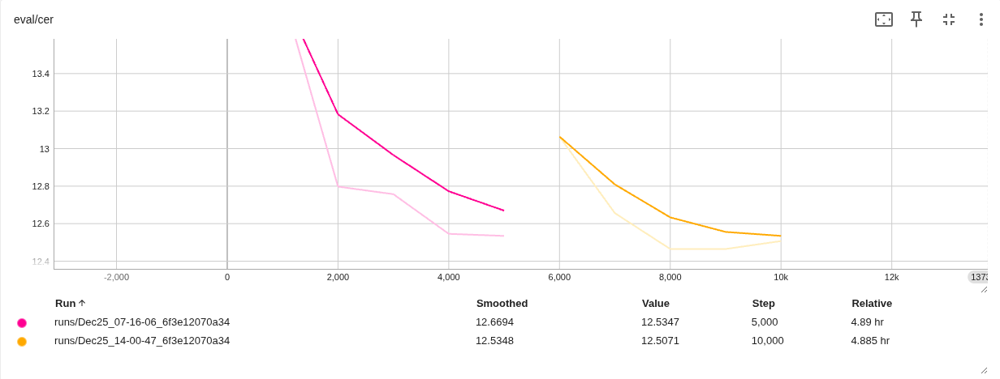

Here's the CER of the Mandarin, then Cantonese model as a function of steps:
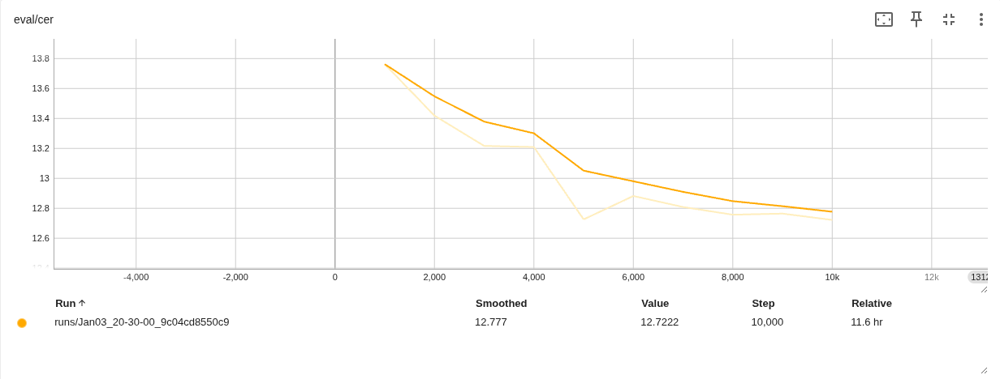

It should be noted that both models were often overfitting to the training data. More figures can be seen in the tensorboards here:

* Cantonese only model: [chengyili2005/whisper-small-canto/tensorboard](https://huggingface.co/chengyili2005/whisper-small-canto/tensorboard)
* Mandarin -> Cantonese model: [chengyili2005/whisper-small-mando-canto/tensorboard](https://huggingface.co/chengyili2005/whisper-small-mando-canto/tensorboard)